In [1]:
# Import packages and libraries

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
#import plotly.express as px
#import geopandas as gpd

from datetime import date
from datetime import datetime


from sklearn.model_selection import PredefinedSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor

from xgboost import XGBClassifier
from xgboost import plot_importance
from xgboost import plot_tree


from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score, make_scorer, fbeta_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, roc_auc_score

import pickle
import math

import statsmodels.api as sm
from scipy import stats


In [2]:
# This lets us see all of the columns, preventing Juptyer from redacting them.
pd.set_option('display.max_columns', None)

input_file_path='/kaggle/input/nyc-taxi-gratuity-prediction-analyze/'

import warnings
warnings.filterwarnings('ignore')

### **Imports and data loading**

**Dataframe in this lab**
* df_credit: credit card subset from df_clean joint crime data
* df_sample: drop unnecessary features from df_credit
* df_dummy: df_subset with dummy encoding
* df_label: df_subset with label encoding

In [3]:
# Load dataset into dataframe
df_credit = pd.read_csv(input_file_path+'nyc_clean_credit_trips.csv',keep_default_na=True)


In [4]:
#confirm null value in crime data
columns=['total_count_PU','Violence_Ratio_PU','Violence_Cnt_PU',
         'Larceny_Ratio_PU','Larceny_Cnt_PU','ViolenceRalated_Ratio_PU',
         'ViolenceRalated_Cnt_PU','diff_Ratio_PU','diff_Cnt_PU',
        'total_count_DO','Violence_Ratio_DO','Violence_Cnt_DO',
         'Larceny_Ratio_DO','Larceny_Cnt_DO','ViolenceRalated_Ratio_DO',
         'ViolenceRalated_Cnt_DO','diff_Ratio_DO','diff_Cnt_DO']
df_credit[columns].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   total_count_PU            14882 non-null  float64
 1   Violence_Ratio_PU         14882 non-null  float64
 2   Violence_Cnt_PU           14882 non-null  float64
 3   Larceny_Ratio_PU          14882 non-null  float64
 4   Larceny_Cnt_PU            14882 non-null  float64
 5   ViolenceRalated_Ratio_PU  14882 non-null  float64
 6   ViolenceRalated_Cnt_PU    14882 non-null  float64
 7   diff_Ratio_PU             14882 non-null  float64
 8   diff_Cnt_PU               14882 non-null  float64
 9   total_count_DO            14837 non-null  float64
 10  Violence_Ratio_DO         14837 non-null  float64
 11  Violence_Cnt_DO           14837 non-null  float64
 12  Larceny_Ratio_DO          14837 non-null  float64
 13  Larceny_Cnt_DO            14837 non-null  float64
 14  Violen

In [5]:
df_credit.info()

df_credit.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Columns: 124 entries, ID to PUDO_LocationID
dtypes: bool(6), float64(60), int64(34), object(24)
memory usage: 13.5+ MB


,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season,Unnamed: 0,gpb_unit4,mean_distance_unit4,mean_duration_unit4,mean_speed_unit4,predict_fare_amount,mean_trip_duration,mean_trip_distance,mean_trip_speed,tip_percent,tip_percent_int,total_fare,cal_tip,tip_diff,total_fare_diff,tip_percent_notax,within_nyc,cal_tip_round_to_0_01,cal_tip_rounddown_to_0_05,Generous_by_tippercent,NGenerous_by_tippercent,generous,not_generous,total_count_PU,Violence_Ratio_PU,Violence_Cnt_PU,Larceny_Ratio_PU,Larceny_Cnt_PU,ViolenceRalated_Ratio_PU,ViolenceRalated_Cnt_PU,diff_Ratio_PU,diff_Cnt_PU,total_count_DO,Violence_Ratio_DO,Violence_Cnt_DO,Larceny_Ratio_DO,Larceny_Cnt_DO,ViolenceRalated_Ratio_DO,ViolenceRalated_Cnt_DO,diff_Ratio_DO,diff_Cnt_DO,PU_DO_Location,PU_DO_zone,PUDO_LocationID
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring,0,100_231_am_rush,3.340000,14.067000,14.246445,13.010263,14.067000,3.340000,14.246445,20.0,20,13.8,2.760,0.000,0.000,20.0,True,2.76,2.75,1,0,1,0,1965.0,0.204580,402.0,0.535878,1053.0,0.351145,690.0,0.184733,363.0,1987.0,0.211374,420.0,0.428284,851.0,0.358329,712.0,0.069955,139.0,100_231,Garment District_TriBeCa/Civic Center,100_231
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring,1,186_43_daytime,3.095000,23.283250,8.296162,16.265126,23.283250,3.095000,8.296162,23.8,24,16.8,4.032,0.032,0.133,23.8,True,4.03,4.00,1,0,1,0,2256.0,0.143617,324.0,0.731383,1650.0,0.210993,476.0,0.520390,1174.0,631.0,0.335975,212.0,0.353407,223.0,0.534073,337.0,-0.180666,-114.0,186_43,Penn Station/Madison Sq West_Central Park,186_43
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.00,1,N,262,236,1,6.5,0.0,0.5,1.45,0.0,0.3,8.75,7,7,15,15,12,12,Friday,Friday,2017,50,2017-50,2017-12-18,2017-12-15-7,Manhattan,Yorkville East,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-12-18,2.660,2017,2017-12-15 07:00:00,-5.7,51,-14.3,-9.6,0.0,0.0,0.0,0.05,1020.1,1013.5,87,0,75,86,2.9,4.3,263,265,6.8,Manhattan_Manhattan,False,False,False,0,False,7.200,432.0,8.333333,0.902778,6.500000,Fal

### Define common variable

In [6]:
#define valid RatecodeID
RateCodeIDList=[1,2,3,4,5,6]

#define valid PULocationID and DOLocationID(exclude 264 Unknown)
LocationIDList=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105,
 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126,
 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190,
 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211,
 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232,
 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253,
 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 265]

#define locationid list without JFK airport, Newark airport, Unknown, Outside of NYC
LocationID_InsideNYC_Standard=[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105,
 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126,
 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190,
 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211,
 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232,
 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253,
 254, 255, 256, 257, 258, 259, 260, 261, 262, 263]

#taxi zone LocationID of JFK airport
CONST_JFK_LocationID=132

#taxi zone LocationID of LaGuardia Airport
CONST_LaGuardia_LocationID=138

#taxi zone LocationID of Newark airport
CONST_Newark_LocationID=1

#taxi zone LocationID of Unknown
CONST_Unknown_LocationID=264


#Outside of NYC
CONST_Outside_NYC_LocationID=265


#Max work time
MAX_WORK_TIME_MINUTES=720

#Max speed 
MAX_SPEED=70

#rush hour surcharge for Standard Metered Fare
CONST_RUSH_HOUR_SURCHARGE_STANDARD=1

#rush hour surcharge for Manhattan<->JFK
CONST_RUSH_HOUR_SURCHARGE_JFK=4.5

#night time surcharge
CONST_NIGHT_TIME_SURCHARGE=0.5

#standard unit fare: $.50 per One-fifth of a mile 
#or $.50 per minute(60 seconds) traveling at less than 12 miles an hour
STANDARD_UNIT_FARE=0.5

#Standard Metered Fare initial charge
STANDARD_INITIAL_CHARGE=2.5

#define payment type that passenger could use
#1= Credit card 
#2= Cash 
Passenger_Payment=[1,2]




########################################
# Order
########################################
Weekday_Order = ["Sunday","Monday", "Tuesday", "Wednesday", "Thursday", "Friday","Saturday"]


########################################
# Visualization
########################################
#Singal bar color
BAR_COLOR_BLUE='#1f77b4'

In [7]:
###########################################
#Transform Weekday Name columns
###########################################
df_credit['PU_weekday'] = pd.Categorical(df_credit['PU_weekday'], categories=Weekday_Order, ordered=True)
df_credit['PU_weekday'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 14883 entries, 0 to 14882
Series name: PU_weekday
Non-Null Count  Dtype   
--------------  -----   
14883 non-null  category
dtypes: category(1)
memory usage: 15.0 KB


In [8]:
df_credit['tip_percent']=round(df_credit['tip_amount']*100/(df_credit['total_amount']-df_credit['tip_amount']),1)
df_credit['tip_percent_int']=round(df_credit['tip_amount']*100/(df_credit['total_amount']-df_credit['tip_amount']),0)
df_credit['tip_percent_int']=df_credit['tip_percent_int'].astype(int)

df_credit['total_fare']=round(df_credit['total_amount']-df_credit['tip_amount'],3)
df_credit['cal_tip']=round(df_credit['total_fare']*df_credit['tip_percent_int']*0.01,3)
df_credit['tip_diff']=round(df_credit['cal_tip']-df_credit['tip_amount'],3)
df_credit['total_fare_diff']=round(df_credit['total_fare']-(df_credit['tip_amount']*100/df_credit['tip_percent_int']),3)
#since some trips tip_percent_int=0
df_credit['total_fare_diff']=df_credit['total_fare_diff'].fillna(0)

df_credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Columns: 124 entries, ID to PUDO_LocationID
dtypes: bool(6), category(1), float64(60), int64(34), object(23)
memory usage: 13.4+ MB


### Feature selection

In [9]:
#add VendorID(to confirm importance of this feature when not consider vendor calculation logic differences)
#add from the end
target_columns=['generous', 'not_generous',
                'Generous_by_tippercent', 'NGenerous_by_tippercent',
                'PULocationID', 'DOLocationID','RatecodeID',
                'mean_trip_distance','mean_trip_duration','mean_trip_speed','predict_fare_amount',
                'PU_month','PU_season','PU_weekday', 'holiday',
                'PU_hour_class','PU_hour',
                'VendorID',
                'total_count_PU','total_count_DO','within_nyc',
                'Violence_Ratio_PU','Violence_Cnt_PU','Larceny_Ratio_PU','Larceny_Cnt_PU',
                'Violence_Ratio_DO','Violence_Cnt_DO','Larceny_Ratio_DO','Larceny_Cnt_DO',
                'ViolenceRalated_Ratio_PU','ViolenceRalated_Cnt_PU','diff_Ratio_PU','diff_Cnt_PU',
                'ViolenceRalated_Ratio_DO','ViolenceRalated_Cnt_DO','diff_Ratio_DO','diff_Cnt_DO',
               ]
df_sample=df_credit[target_columns]

In [10]:
#encode holiday
holiday_map={
    True: 1,
    False: 0
}
df_sample['holiday']=df_sample['holiday'].map(holiday_map)

#encode RatecodeID
ratecodeid_map={
    1:'Standard_rate',
    2:'JFK',
    3:'Newark',
    4:'Nassau_or_Westchester',
    5:'Negotiated_fare',
    6:'Group_ride'
}
df_sample['RatecodeID_str']=df_sample['RatecodeID']
df_sample['RatecodeID_str']=df_sample['RatecodeID_str'].map(ratecodeid_map)
df_sample=pd.get_dummies(df_sample,columns=['RatecodeID_str'], prefix_sep='_', dtype=bool, prefix=None)

df_sample.head()

,generous,not_generous,Generous_by_tippercent,NGenerous_by_tippercent,PULocationID,DOLocationID,RatecodeID,mean_trip_distance,mean_trip_duration,mean_trip_speed,predict_fare_amount,PU_month,PU_season,PU_weekday,holiday,PU_hour_class,PU_hour,VendorID,total_count_PU,total_count_DO,within_nyc,Violence_Ratio_PU,Violence_Cnt_PU,Larceny_Ratio_PU,Larceny_Cnt_PU,Violence_Ratio_DO,Violence_Cnt_DO,Larceny_Ratio_DO,Larceny_Cnt_DO,ViolenceRalated_Ratio_PU,ViolenceRalated_Cnt_PU,diff_Ratio_PU,diff_Cnt_PU,ViolenceRalated_Ratio_DO,ViolenceRalated_Cnt_DO,diff_Ratio_DO,diff_Cnt_DO,RatecodeID_str_JFK,RatecodeID_str_Nassau_or_Westchester,RatecodeID_str_Negotiated_fare,RatecodeID_str_Newark,RatecodeID_str_Standard_rate
0,1,0,1,0,100,231,1,3.340000,14.067000,14.246445,13.010263,3,spring,Saturday,1,am_rush,8,2,1965.0,1987.0,True,0.204580,402.0,0.535878,1053.0,0.211374,420.0,0.428284,851.0,0.351145,690.0,0.184733,363.0,0.358329,712.0,0.069955,139.0,False,False,False,False,True
1,1,0,1,0,186,43,1,3.095000,23.283250,8.296162,16.265126,4,spring,Tuesday,0,daytime,14,1,2256.0,631.0,True,0.143617,324.0,0.731383,1650.0,0.335975,212.0,0.353407,223.0,0.210993,476.0,0.520390,1174.0,0.534073,337.0,-0.180666,-114.0,False,False,False,False,True
2,1,0,0,1,262,236,1,0.875714,6.407286,8.848934,6.116305,12,winter,Friday,0,am_rush,7,1,617.0,1254.0,True,0.291734,180.0,0.419773,259.0,0.179426,225.0,0.649920,815.0,0.452188,279.0,-0.032415,-20.0,0.251994,316.0,0.397927,499.0,False,False,False,False,True
3,1,0,1,0,188,97,1,3.700000,30.250000,7.338843,19.392487,5,spring,Sunday,1,daytime,13,2,4206.0,2288.0,True,0.373990,1573.0,0.276510,1163.0,0.307692,704.0,0.394231,902.0,0.597004,2511.0,-0.320495,-1348.0,0.521853,1194.0,-0.127622,-292.0,False,False,False,False,True
4,1,0,1,0,161,236,1,2.195000,8.908250,15.626526,9.225913,3,spring,Saturday,1,nighttime,20,2,1583.0,1254.0,True,0.162350,257.0,0.674668,1068.0,0.179426,225.0,0.649920,815.0,0.258370,409.0,0.416298,659.0,0.251994,316.0,0.397927,499.0,False,False,False,False,True


### Build Models

#### Dummy encoding

In [11]:
######################################################
#Dummy encoding
######################################################
# 1. Define list of cols to convert to string
df_dummy=df_sample.copy()
cols_to_str=['RatecodeID','PULocationID','DOLocationID','PU_month','PU_hour']

# 2. Convert each column to string
for col in cols_to_str:
    df_dummy[col]=df_dummy[col].astype(str)

#confirm after update
df_dummy.info()

#**************************#
#Confirm column names
#**************************#
#check object type and see if any object columns+'_' exists in other columns(e.g. RatecodeID and RatecodeID_XXXX NG)
#get columns which could be convert into dummy/indicator variables
trans_dummy_variables=list(df_dummy.select_dtypes(include=[object,'category']).columns)

#get columns which could not be convert into dummy/indicator variables
not_trans_dummy_variables=list(df_dummy.select_dtypes(exclude=[object,'category']).columns)

#after dummy encoding, their column name would be XXXX->XXXX_YYYY1,XXXX_YYYY2....
#get_fit_features will not work correctly if both XXXX and XXXX_?(Not columns after dummy encoding)(? means any word) exist
#e.g. RatecodeID and RatecodeID_good, RatecodeID_others will be NG
#RatecodeID and RatecodeIDA_good, Ratecode_BBB will be OK
if len(trans_dummy_variables)+len(not_trans_dummy_variables)!=len(df_dummy.columns):
    raise Exception("Data type incorrect, please check again")
if not (set(trans_dummy_variables).union(set(not_trans_dummy_variables))==set(df_dummy.columns)):
    raise Exception("Data type incorrect, please check again")
print(trans_dummy_variables)
dummy_prefix_sep='_dummy_'
duplicate_flg=False

for dummy_col in trans_dummy_variables:
    for not_trans_col in not_trans_dummy_variables:
        if (dummy_col+dummy_prefix_sep) in not_trans_col:
            duplicate_flg=True
if duplicate_flg==True:
    raise Exception("Dummy variable columns duplicated with others, please update column names")



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Data columns (total 42 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   generous                              14883 non-null  int64   
 1   not_generous                          14883 non-null  int64   
 2   Generous_by_tippercent                14883 non-null  int64   
 3   NGenerous_by_tippercent               14883 non-null  int64   
 4   PULocationID                          14883 non-null  object  
 5   DOLocationID                          14883 non-null  object  
 6   RatecodeID                            14883 non-null  object  
 7   mean_trip_distance                    14883 non-null  float64 
 8   mean_trip_duration                    14883 non-null  float64 
 9   mean_trip_speed                       14883 non-null  float64 
 10  predict_fare_amount                   14883 non-null  float64 
 11  PU

In [12]:
# Convert categoricals to binary
df_dummy=pd.get_dummies(df_dummy,columns=['PULocationID', 'DOLocationID', 'RatecodeID', 'PU_month', 'PU_season', 'PU_weekday', 'PU_hour_class', 'PU_hour'], prefix_sep=dummy_prefix_sep, dtype=bool, prefix=None)
df_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Columns: 390 entries, generous to PU_hour_dummy_9
dtypes: bool(362), float64(22), int64(6)
memory usage: 8.3 MB


#### Label encoding

In [13]:
######################################################
#Label encoding
######################################################
df_label=df_sample.copy()

#******************************#
#label encoding
#******************************#
#encoding PU_season
season_map={
    "spring": 0,
    "summer": 1,
    "autumn": 2,
    "winter": 3,
}
hour_class_map={
    'nighttime':0,
    'am_rush':1,
    'pm_rush':2,
    'daytime':3,
}

df_label['PU_season']=df_label['PU_season'].map(season_map)
df_label['PU_hour_class']=df_label['PU_hour_class'].map(hour_class_map)
df_label['PU_weekday']=df_label['PU_weekday'].cat.codes
#confirm after update
df_label.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14883 entries, 0 to 14882
Data columns (total 42 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   generous                              14883 non-null  int64  
 1   not_generous                          14883 non-null  int64  
 2   Generous_by_tippercent                14883 non-null  int64  
 3   NGenerous_by_tippercent               14883 non-null  int64  
 4   PULocationID                          14883 non-null  int64  
 5   DOLocationID                          14883 non-null  int64  
 6   RatecodeID                            14883 non-null  int64  
 7   mean_trip_distance                    14883 non-null  float64
 8   mean_trip_duration                    14883 non-null  float64
 9   mean_trip_speed                       14883 non-null  float64
 10  predict_fare_amount                   14883 non-null  float64
 11  PU_month       

#### Evaluation metric

**generous or Generous_by_tippercent**
* False positives (the model predicts a tip ≥ 20%, but the customer does not give one), drivers may feel dissatisfacied or frustrating
* False negatives (the model predicts a tip < 20%, but the customer gives more), drivers may reject passengers or provide poor service, passengers will feel dissatisfacied

In this case need to weigh both precision and recall equally, use **f1** as evaluation metric


In [14]:
#confirm proportion of generous passengers(consider tip amount calculation difference between vendors)
display(df_dummy['generous'].value_counts(normalize=True))

#confirm proportion of not generous passengers(Just compare, will not use)
display(df_dummy['not_generous'].value_counts(normalize=True))

#confirm proportion of generous passengers(not consider tip amount calculation difference between vendors)
display(df_dummy['Generous_by_tippercent'].value_counts(normalize=True))

#confirm proportion of not generous passengers(Just compare, will not use)
display(df_dummy['NGenerous_by_tippercent'].value_counts(normalize=True))

generous
1    0.696701
0    0.303299
Name: proportion, dtype: float64

not_generous
0    0.696701
1    0.303299
Name: proportion, dtype: float64

Generous_by_tippercent
1    0.528254
0    0.471746
Name: proportion, dtype: float64

NGenerous_by_tippercent
0    0.528254
1    0.471746
Name: proportion, dtype: float64

### Split data into train, val, test

Use train set to train models<BR/>
Use val set to evaluate and select champion model<BR/>
Use test set to test champion model<BR/>

|Dependent variable|Description|
|:-               |:-         |
|generous|1:customer tipped(tip_amount) ≥ total_fare*20%(round to .01 or .05)<BR/> 0: otherwise|
|not_generous|1:customer tipped(tip_amount) < total_fare*20%(round to .01 or .05)<BR/>0:otherwise|
|Generous_by_tippercent|1:customer tipped(tip_percent) ≥ 20%<BR/>0:customer tipped(tip_percent) < 20%|
|NGenerous_by_tippercent|1:customer tipped(tip_percent) < 20%<BR/>0:customer tipped(tip_percent) ≥ 20%|

* total_fare=total_amount-tip_amount
* tip_percent=tip_amount/total_fare

In [15]:
RANDOM_STATE=0
depedent_variables=['generous','not_generous','Generous_by_tippercent','NGenerous_by_tippercent']
################################################
#Use dummy encoding dataset
################################################
y_dummy_list=[]
for depedent_var in depedent_variables:
    y_dummy=df_dummy[depedent_var]
    y_dummy_list.append(y_dummy)

X_dummy = df_dummy.copy()
X_dummy = X_dummy.drop(depedent_variables, axis = 1)


#*****************************************#
# Split into train and test sets
#*****************************************#
X_dummy_train_val_list=[]
y_dummy_train_val_list=[]
X_dummy_test_list=[]
y_dummy_test_list=[]
X_dummy_train_list=[]
y_dummy_train_list=[]
X_dummy_val_list=[]
y_dummy_val_list=[]

for y_dummy in y_dummy_list:
    X_dummy_train_val, X_dummy_test, y_dummy_train_val, y_dummy_test = train_test_split(X_dummy, y_dummy, 
                                                        test_size=0.25, stratify=y_dummy, 
                                                        random_state=RANDOM_STATE)
    
    # Split train into train and validation sets
    X_dummy_train, X_dummy_val, y_dummy_train, y_dummy_val = train_test_split(X_dummy_train_val, y_dummy_train_val, 
                                                      test_size=0.2, stratify=y_dummy_train_val, 
                                                      random_state=RANDOM_STATE)
    X_dummy_train_val_list.append(X_dummy_train_val)
    y_dummy_train_val_list.append(y_dummy_train_val)
    X_dummy_test_list.append(X_dummy_test)
    y_dummy_test_list.append(y_dummy_test)
    X_dummy_train_list.append(X_dummy_train)
    y_dummy_train_list.append(y_dummy_train)
    X_dummy_val_list.append(X_dummy_val)
    y_dummy_val_list.append(y_dummy_val)

################################################
#Use Label encoding dataset
################################################
y_label_list=[]
for depedent_var in depedent_variables:
    y_label=df_label[depedent_var]
    y_label_list.append(y_label)

X_label = df_label.copy()
X_label = X_label.drop(depedent_variables, axis = 1)

#*****************************************#
# Split into train and test sets
#*****************************************#
X_label_train_val_list=[]
y_label_train_val_list=[]
X_label_test_list=[]
y_label_test_list=[]
X_label_train_list=[]
y_label_train_list=[]
X_label_val_list=[]
y_label_val_list=[]

for y_label in y_label_list:
    X_label_train_val, X_label_test, y_label_train_val, y_label_test = train_test_split(X_label, y_label, 
                                                        test_size=0.25, stratify=y_label, 
                                                        random_state=RANDOM_STATE)
    
    # Split train into train and validation sets
    X_label_train, X_label_val, y_label_train, y_label_val = train_test_split(X_label_train_val, y_label_train_val, 
                                                      test_size=0.2, stratify=y_label_train_val, 
                                                      random_state=RANDOM_STATE)
    X_label_train_val_list.append(X_label_train_val)
    y_label_train_val_list.append(y_label_train_val)
    X_label_test_list.append(X_label_test)
    y_label_test_list.append(y_label_test)
    X_label_train_list.append(X_label_train)
    y_label_train_list.append(y_label_train)
    X_label_val_list.append(X_label_val)
    y_label_val_list.append(y_label_val)

In [16]:
total_count=df_sample.shape[0]
positive_negative_ratio_list=[]
for dep_var in depedent_variables:
    positive_cnt=df_sample[dep_var].sum()
    negative_cnt=total_count-positive_cnt
    positive_negative_ratio=round(negative_cnt/positive_cnt,1)
    positive_negative_ratio_list.append(positive_negative_ratio)
    print(dep_var,positive_negative_ratio)

generous 0.4
not_generous 2.3
Generous_by_tippercent 0.9
NGenerous_by_tippercent 1.1


#### Feature selection

In [17]:
df_sample.columns

Index(['generous', 'not_generous', 'Generous_by_tippercent',
       'NGenerous_by_tippercent', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour', 'VendorID', 'total_count_PU',
       'total_count_DO', 'within_nyc', 'Violence_Ratio_PU', 'Violence_Cnt_PU',
       'Larceny_Ratio_PU', 'Larceny_Cnt_PU', 'Violence_Ratio_DO',
       'Violence_Cnt_DO', 'Larceny_Ratio_DO', 'Larceny_Cnt_DO',
       'ViolenceRalated_Ratio_PU', 'ViolenceRalated_Cnt_PU', 'diff_Ratio_PU',
       'diff_Cnt_PU', 'ViolenceRalated_Ratio_DO', 'ViolenceRalated_Cnt_DO',
       'diff_Ratio_DO', 'diff_Cnt_DO', 'RatecodeID_str_JFK',
       'RatecodeID_str_Nassau_or_Westchester',
       'RatecodeID_str_Negotiated_fare', 'RatecodeID_str_Newark',
       'RatecodeID_str_Standard_rate'],
      dtype='object')

In [18]:
# in production environment, it might be difficult to get VendorID or crime data
# and crime data may not be robust(could not get real time data, may depend on police resource, economy, politics, etc)
# For comparison some models contains VendorID or crime data
select_col_list=[
    #Index 1
    ['PULocationID', 'DOLocationID', 'RatecodeID',
       'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour'],
    #Index 2
    ['PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour'],
    #Index 3 (add VendorID)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour'],
    #Index 4 (add crime count)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO', ],
    #Index 5 (one-hot encoding RatecodeID)
    ['VendorID', 'PULocationID', 'DOLocationID', 
       'RatecodeID_str_Standard_rate','RatecodeID_str_JFK', 'RatecodeID_str_Nassau_or_Westchester',
       'RatecodeID_str_Negotiated_fare', 'RatecodeID_str_Newark',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO', ],
    #Index 6 (within_nyc)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO', 'within_nyc',],
    #Index 7 (add crime ratio)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'Violence_Ratio_PU','Larceny_Ratio_PU','Violence_Ratio_DO', 'Larceny_Ratio_DO'],
     #Index 8 (add crime count)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'Violence_Cnt_PU','Larceny_Cnt_PU','Violence_Cnt_DO', 'Larceny_Cnt_DO'],
     #Index 9 (add crime ratio and total count)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU','Larceny_Ratio_PU',
     'ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO'],
    #Index 10 (add crime diff ratio and total count)
    ['VendorID', 'PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO','diff_Ratio_PU','diff_Ratio_DO'],
    #Index 11 (index 10 delete VendorID )
    ['PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO','diff_Ratio_PU','diff_Ratio_DO'],
    #Index 12 (index 9 delete VendorID )
    ['PULocationID', 'DOLocationID', 'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_season', 'PU_weekday', 'holiday',
       'PU_hour_class', 'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU','Larceny_Ratio_PU',
     'ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO'],
    #Index 13 
    [  'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU',
       'Larceny_Ratio_PU','ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO',
        ],
    #Index 14 (Index2 - 'PULocationID', 'DOLocationID', holiday, PU_season, PU_hour_class)
    [  'RatecodeID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour'
       ],
    #Index 15 
    [  'RatecodeID','VendorID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU',
       'Larceny_Ratio_PU','ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO',
        ],
    #Index 16 
    [  'RatecodeID','VendorID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour'
       ],
     #Index 17 (RatecodeID->within_nyc)
    [  'within_nyc',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU',
       'Larceny_Ratio_PU','ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO',
        ],
    #Index 18 (RatecodeID->within_nyc)
    [  'within_nyc',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour'
       ],
    #Index 19 (RatecodeID->within_nyc)
    [  'within_nyc','VendorID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour',
       'total_count_PU','total_count_DO','ViolenceRalated_Ratio_PU',
       'Larceny_Ratio_PU','ViolenceRalated_Ratio_DO', 'Larceny_Ratio_DO',
        ],
    #Index 20 (RatecodeID->within_nyc)
    [  'within_nyc','VendorID',
       'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed',
       'predict_fare_amount', 'PU_month', 'PU_weekday',
       'PU_hour'
       ],
]

In [19]:
import pickle 

# Define a path to the folder where you want to save the model
path = '/kaggle/working/'

path_rf = path+'rf_pickle/'
path_xgb = path+'xgb_pickle/'

import os
def create_dir(dir_path):
    # Create the directory
    try:
        os.mkdir(dir_path)
        print(f"Directory '{dir_path}' created successfully.")
    except FileExistsError:
        print(f"Directory '{dir_path}' already exists.")
    except PermissionError:
        print(f"Permission denied: Unable to create '{dir_path}'.")
    except Exception as e:
        print(f"An error occurred: {e}")

def write_pickle(path, model_object, save_name:str):
    '''
    save_name is a string.
    '''
    with open(path + save_name + '.pickle', 'wb') as to_write:
        pickle.dump(model_object, to_write)

def read_pickle(path, saved_model_name:str):
    '''
    saved_model_name is a string.
    '''
    with open(path + saved_model_name + '.pickle', 'rb') as to_read:
        model = pickle.load(to_read)

        return model


import re
def find_number(text, c):
    temp = re.findall(r'%s(\d+)' % c, text)
    res = list(map(int, temp))
    return res


def chk_dummy_col(select_cols,dummy_colname_list,dummy_prefix_sep):
    for select_col in select_cols:
        select_col_exist_flg=False
        for dummy_col in dummy_colname_list:
            if select_col in dummy_col:
                select_col_exist_flg=True
            elif (select_col+dummy_prefix_sep) in dummy_col:
                #dummy column
                select_col_exist_flg=True
        if select_col_exist_flg==False:
            raise Exception(f"{select_col} doesn't exist")
            
def chk_if_dummy_encoding(select_cols,dummy_colname_list,dummy_prefix_sep):
    select_length=len(select_cols)
    dummy_length=len(dummy_colname_list)
    i=0
    chk_result=False
    while (i < select_length)&(chk_result==False):
        select_col=select_cols[i]
        dummy_jump_flg=False
        select_col_exist_flg=False
        j=0
        while (j<dummy_length)&(dummy_jump_flg==False):
            dummy_col=dummy_colname_list[j]
            if (select_col+dummy_prefix_sep) in dummy_col:
                dummy_jump_flg=True
            j=j+1
        if dummy_jump_flg==True:
            chk_result=True
        i=i+1
    if chk_result==True:
        chk_dummy_col(select_cols,dummy_colname_list,dummy_prefix_sep)
    return chk_result

    
def get_dummy_colnames(select_cols,dummy_colname_list):
    """
    select_cols(list): original columns
    dummy_colname_list(list): column list after dummy encoding
    """
    #separator/delimiter to use in dummy encoding
    dummy_prefix_sep='_dummy_'
    res_dummy_colnames=list(dummy_colname_list)
    #check setting
    if chk_if_dummy_encoding(select_cols,dummy_colname_list,dummy_prefix_sep)==False:
        raise Exception("Not dummy encoding")
        
    for dummy_col in dummy_colname_list:
        if dummy_col not in select_cols:
            jump_flg=False
            for col in select_cols:
                if (col+dummy_prefix_sep) in dummy_col:
                    jump_flg=True
            if jump_flg==False:
                res_dummy_colnames.remove(dummy_col) 
    return res_dummy_colnames




def get_fit_features(select_cols, transformed_cols, encoding_type:str,exclude_target_var=True):
    """
    Get fitting feature list
        select_cols(list): original columns(before encoding)
        transformed_cols(list): transformed columns(after encoding)
        encoding_type(string): dummy or label encoding type
        exclude_target_var(Bool): exclude target variable or not
    """
    
    #target_variable_list=['generous', 'not_generous']
    target_variable_list=depedent_variables
    label_encoding_drop_list=['day','month']
    valid_encoding=['dummy','label']
    if encoding_type not in valid_encoding:
        raise Exception("Only 'dummy' or 'label' allowed")
    select_features=select_cols.copy()
    if exclude_target_var==True:
        #drop target variables
        for target_var in target_variable_list:
            if target_var in select_features:
                select_features.remove(target_var)

    #if label encoding, drop non-number columns
    if encoding_type=='label':
        for drop_col in label_encoding_drop_list:
            if drop_col in select_features:
                select_features.remove(drop_col)
        for select_feature in select_features:
            if select_feature not in transformed_cols:
                raise Exception("select_cols, transformed_cols ,encoding_type unmatch")
        res_feature_list=select_features
    else:
        res_feature_list=get_dummy_colnames(select_features,transformed_cols)
    return res_feature_list



import os.path
def check_picklefile_exists(path, saved_model_name:str):
    """
    Check if pickle exists
    """
    fname=path + saved_model_name + '.pickle'
    if os.path.isfile(fname)==True:
        return True
    else:
        return False


def confusion_matrix_plot(model, x_data, y_data,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='')  # `values_format=''` suppresses scientific notation
    plt.title(title)
    plt.show()
    
def confusion_matrix_plot_ax(model, x_data, y_data,ax,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='',ax=ax)  # `values_format=''` suppresses scientific notation
    ax.set_title(title)



#https://scikit-learn.org/stable/modules/generated/sklearn.metrics.fbeta_score.html
def get_test_scores(model_name:str, preds, y_test_data,preds_prob):
    '''
    Generate a table of test scores.

    In:
    model_name (string): Your choice: how the model will be named in the output table
    preds: numpy array of test predictions
    y_test_data: numpy array of y_test data
    preds_prob: numpy array of predicted class probabilities

    Out:
    table: a pandas df of precision, recall, f1, and accuracy scores for your model
    '''
    accuracy = accuracy_score(y_test_data, preds)
    precision = precision_score(y_test_data, preds)
    recall = recall_score(y_test_data, preds)
    f1 = f1_score(y_test_data, preds)
    
    #positive_negative_ratio_list
    #fbeta score for dependent variable1
    fbeta1_score=fbeta_score(y_test_data, preds, average='binary', beta=positive_negative_ratio_list[0])
    #fbeta score for dependent variable2
    fbeta2_score=fbeta_score(y_test_data, preds, average='binary', beta=positive_negative_ratio_list[1])
    #fbeta score for dependent variable3
    fbeta3_score=fbeta_score(y_test_data, preds, average='binary', beta=positive_negative_ratio_list[2])
    #fbeta score for dependent variable4
    fbeta4_score=fbeta_score(y_test_data, preds, average='binary', beta=positive_negative_ratio_list[3])

    # Compute the ROC AUC score
    #https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html
    roc_auc = roc_auc_score(y_test_data, preds_prob) 

    table = pd.DataFrame({'model': [model_name],
                        'precision': [precision],
                        'recall': [recall],
                        'F1': [f1],
                        'accuracy': [accuracy],
                        'ROC_AUC': [roc_auc],
                        'Fbeta1': [fbeta1_score],
                        'Fbeta2': [fbeta2_score],
                        'Fbeta3': [fbeta3_score],
                        'Fbeta4': [fbeta4_score],
                        })

    return table

In [20]:
import datetime

def compute_run_duration(run_start_time,run_end_time):
    run_duration=run_end_time-run_start_time
    run_minutes=math.floor(run_duration.total_seconds()/60)
    run_seconds=math.floor(run_duration.total_seconds()-run_minutes*60)
    return f'{run_minutes} min {run_seconds} s'


def chk_encoding_type(encoding_type):
    valid_encoding=['dummy','label']
    if type(encoding_type) == str:
        if encoding_type not in valid_encoding:
            raise Exception("Only 'dummy' or 'label' allowed")
    elif type(encoding_type) == list:
        if (set(valid_encoding)==set(encoding_type)) &(len(valid_encoding)==len(encoding_type)) == False:
            raise Exception("Only 'dummy' and 'label' two element list are allowed")
    

def compute_index_list(input_index):
    """
        compute index list
        Input:
           input_index(int or list): input index
        Output:
            output_index_list(list): list of int
                return [1,input_index] when input_index is int
                return input_index when input_index is a list
    """
    if type(input_index)==int:
        if input_index<1:
            raise Exception("Index start from 1")
        else:
            output_index_list=list(range(1,input_index+1))
    elif type(input_index)==list:
        output_index_list=input_index.copy()
        for index_num in output_index_list:
            if type(index_num) != int:
               raise Exception("Index should be int") 
    else:
        raise Exception("Index should be int or list")
    return output_index_list

def compute_encoding_list(encoding_type):  
    chk_encoding_type(encoding_type)
    if type(encoding_type)==str:
        encoding_type_list=list(encoding_type)
    elif type(encoding_type)==list:
        encoding_type_list=encoding_type
    return encoding_type_list



In [21]:
###################################################
#Create Directory for pickle file
###################################################
create_dir(path_rf)
create_dir(path_xgb)

Directory '/kaggle/working/rf_pickle/' created successfully.
Directory '/kaggle/working/xgb_pickle/' created successfully.


### XGBoost

In [22]:
#start from 1
select_index=14
select_col=select_col_list[select_index-1]
dummy_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
label_feature=get_fit_features(select_col,X_label_train.columns,'label')
#print(dummy_feature)
print(label_feature)
result={
    'sqrt dummy': np.sqrt(len(X_dummy_train[dummy_feature].columns)),
    'log dummy': np.log(len(X_dummy_train[dummy_feature].columns)),
    '0.2 dummy': len(X_dummy_train[dummy_feature].columns)*0.2,
    '0.3 dummy': len(X_dummy_train[dummy_feature].columns)*0.3,
    '0.4 dummy': len(X_dummy_train[dummy_feature].columns)*0.4,
    '0.5 dummy': len(X_dummy_train[dummy_feature].columns)*0.5,
    '0.7 dummy': len(X_dummy_train[dummy_feature].columns)*0.7,
    '0.9 dummy': len(X_dummy_train[dummy_feature].columns)*0.9,
    '1 dummy': len(X_dummy_train[dummy_feature].columns)*1,
    'sqrt label': np.sqrt(len(X_label_train[label_feature].columns)),
    'log label': np.log(len(X_label_train[label_feature].columns)),
    '0.3 label': (len(X_label_train[label_feature].columns))*0.3,
    '0.5 label': (len(X_label_train[label_feature].columns))*0.5,
    '0.7 label': (len(X_label_train[label_feature].columns))*0.7,
    '0.9 label': (len(X_label_train[label_feature].columns))*0.9,
    '1 label': (len(X_label_train[label_feature].columns))*1,
}
pd.DataFrame(data=[result])

['RatecodeID', 'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed', 'predict_fare_amount', 'PU_month', 'PU_weekday', 'PU_hour']


,sqrt dummy,log dummy,0.2 dummy,0.3 dummy,0.4 dummy,0.5 dummy,0.7 dummy,0.9 dummy,1 dummy,sqrt label,log label,0.3 label,0.5 label,0.7 label,0.9 label,1 label
0,7.211103,3.951244,10.4,15.6,20.8,26.0,36.4,46.8,52,2.828427,2.079442,2.4,4.0,5.6,7.2,8


In [23]:
max_depth=7
train_cnt=X_label_train.shape[0]

for max_depth in [3,5, 6,7,8,9,11,15]:
    leaf_node_cnt=2**(max_depth)
    avg_leaf_cnt=math.floor(train_cnt/leaf_node_cnt)
    avg_leaf_percent=avg_leaf_cnt/train_cnt
    print(f"Max depth:{max_depth}, leaf node count: {leaf_node_cnt}, avg leaf count: {avg_leaf_cnt}, average leaf node percent: {avg_leaf_percent}")

Max depth:3, leaf node count: 8, avg leaf count: 1116, average leaf node percent: 0.12498600067196775
Max depth:5, leaf node count: 32, avg leaf count: 279, average leaf node percent: 0.031246500167991936
Max depth:6, leaf node count: 64, avg leaf count: 139, average leaf node percent: 0.01556725277186695
Max depth:7, leaf node count: 128, avg leaf count: 69, average leaf node percent: 0.007727629073804457
Max depth:8, leaf node count: 256, avg leaf count: 34, average leaf node percent: 0.0038078172247732107
Max depth:9, leaf node count: 512, avg leaf count: 17, average leaf node percent: 0.0019039086123866053
Max depth:11, leaf node count: 2048, avg leaf count: 4, average leaf node percent: 0.00044797849703214247
Max depth:15, leaf node count: 32768, avg leaf count: 0, average leaf node percent: 0.0


In [24]:
xgb = XGBClassifier(objective='binary:logistic', random_state=RANDOM_STATE) 

xgb_cv_dummy_params_list=[
    #index:1
    {'max_depth': [5,6,7], 
     'min_child_weight': [1],
     'learning_rate': [0.1,0.2, 0.3],
     'n_estimators': [50, 75, 100, 125, 150],
     'subsample':[0.3,0.5,0.7,None],
     'colsample_bytree':[0.05,0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
    },
    #index:2
    {'max_depth': [5,6,7], 
     'min_child_weight': [1,0.005,0.01,0.03],
     'learning_rate': [0.1,0.2, 0.3],
     'n_estimators': [60, 80, 100, 120],
     'subsample':[0.3,0.6,0.9],
     'colsample_bytree':[0.2, 0.4, 0.6, 0.8]
    },
    #index:3 (tune target variable1)
    {'max_depth': [6,7,8,9], 
     'min_child_weight': [0.001,0.005,0.007,0.01],
     'learning_rate': [0.1,0.15, 0.25],
     'n_estimators': [ 80, 120, 160],
     'subsample':[0.3,0.5,0.7,0.9],
     'colsample_bytree':[0.2, 0.3, 0.4, 0.5, 0.6,0.7,0.9],
     'scale_pos_weight':[0.4],
    },
    
]

#https://xgboost.readthedocs.io/en/latest/parameter.html
#scale_pos_weight: Control the balance of positive and negative weights, 
#useful for unbalanced classes. 
#A typical value to consider: sum(negative instances) / sum(positive instances)
xgb_cv_label_params_list=[
    #index:1
    {'max_depth': [5,6,7], 
     'min_child_weight': [1],
     'learning_rate': [0.1,0.2, 0.3],
     'n_estimators': [50, 75, 100, 125, 150],
     'subsample':[0.3,0.5,0.7,None],
     'colsample_bytree':[0.3, 0.4, 0.5, 0.6, 0.7, 0.9, 1]
    },
    #index:2 (try to reduce over fitting)
    {'max_depth': [5,6,7], 
     'min_child_weight': [1,0.005,0.01,0.03],
     'learning_rate': [0.1,0.15, 0.25],
     'n_estimators': [60, 80, 100, 120],
     'subsample':[0.3,0.5,0.7],
     'colsample_bytree':[0.3, 0.4, 0.6, 0.8]
    },
    #index:3(add scale_pos_weight)
    {'max_depth': [5,6,7], 
     'min_child_weight': [1],
     'learning_rate': [0.1,0.2, 0.3],
     'n_estimators': [50, 75, 100, 125, 150],
     'subsample':[0.3,0.5,0.7,None],
     'colsample_bytree':[0.3, 0.4, 0.5, 0.6, 0.7, 0.9, 1],
     'scale_pos_weight':[0.4]
    },
    #index:4 (try to reduce over fitting)
    {'max_depth': [5,6,7], 
     'min_child_weight': [1,0.005,0.01,0.03],
     'learning_rate': [0.05,0.1, 0.2],
     'n_estimators': [50, 75, 100, 125, 150, 180],
     'subsample':[0.3,0.5,0.7],
     'colsample_bytree':[0.3, 0.4, 0.6, 0.8]
    },
    #index:5 (tune for vendorid)
    {'max_depth': [5,6,7], 
     'min_child_weight': [1,0.005,0.01,0.03],
     'learning_rate': [0.1,0.15, 0.25],
     'n_estimators': [60, 80, 100, 120, 140, 160],
     'subsample':[0.3,0.5,0.7],
     'colsample_bytree':[0.3,0.5, 0.7, 0.9]
    },
    #index:6 (tune for total crime)
    {'max_depth': [5,6,7], 
     'min_child_weight': [1],
     'learning_rate': [0.1,0.15, 0.25],
     'n_estimators': [60, 80, 100, 120, 140, 160],
     'subsample':[0.3,0.5,0.7],
     'colsample_bytree':[0.3,0.5, 0.7, 0.9]
    },
     #index:7 (tune target variable1)
    {'max_depth': [5,6,7], 
     'min_child_weight': [0.005,0.01,0.03],
     'learning_rate': [0.1,0.15, 0.25],
     'n_estimators': [60, 80, 100, 120, 140, 160],
     'subsample':[0.3,0.5,0.7],
     'colsample_bytree':[0.3,0.5, 0.6, 0.7, 0.8, 0.9],
     'scale_pos_weight':[0.4]
    },
    #index:8 (tune target variable2)
   {'max_depth': [5,6,7], 
     'min_child_weight': [0.005,0.01,0.03],
     'learning_rate': [0.1,0.15, 0.25],
     'n_estimators': [60, 80, 100, 120, 140, 160],
     'subsample':[0.3,0.5,0.7],
     'colsample_bytree':[0.3,0.5, 0.6, 0.7, 0.8, 0.9],
     'scale_pos_weight':[2.3]
    },
    #index:9 (tune target variable3)
   {'max_depth': [5,6,7], 
     'min_child_weight': [0.005,0.01,0.03],
     'learning_rate': [0.1,0.15, 0.25],
     'n_estimators': [60, 80, 100, 120, 140, 160],
     'subsample':[0.3,0.5,0.7],
     'colsample_bytree':[0.3,0.5, 0.6, 0.7, 0.8, 0.9],
     'scale_pos_weight':[0.9]
    },
    #index:10 (tune target variable4)
   {'max_depth': [5,6,7], 
     'min_child_weight': [0.005,0.01,0.03],
     'learning_rate': [0.1,0.15, 0.25],
     'n_estimators': [60, 80, 100, 120, 140, 160],
     'subsample':[0.3,0.5,0.7],
     'colsample_bytree':[0.3,0.5, 0.6, 0.7, 0.8, 0.9],
     'scale_pos_weight':[1.1]
    },
     #index:11 (tune target variable1)
    {'max_depth': [6,7,8,9], 
     'min_child_weight': [0.001,0.003,0.007,0.01],
     'learning_rate': [0.2,0.3, 0.4],
     'n_estimators': [80, 100, 120, 140, 160,180],
     'subsample':[0.3,0.5,0.7,0.9],
     'colsample_bytree':[0.5, 0.6, 0.7, 0.8, 0.9],
     'scale_pos_weight':[0.4]
    },
    #index:12 (tune target variable2)
   {'max_depth': [6,7,8,9], 
     'min_child_weight': [0.001,0.003,0.007,0.01],
     'learning_rate': [0.2,0.3, 0.4],
     'n_estimators': [80, 100, 120, 140, 160,180],
     'subsample':[0.3,0.5,0.7,0.9],
     'colsample_bytree':[0.5, 0.6, 0.7, 0.8, 0.9],
     'scale_pos_weight':[2.3]
    },
    #index:13 (tune target variable3)
   {'max_depth': [5,6,7,8], 
     'min_child_weight': [0.003,0.007,0.01,0.03],
     'learning_rate': [0.01,0.05, 0.1,0.2],
     'n_estimators': [60, 80, 100, 120],
     'subsample':[0.3,0.5,0.7],
     'colsample_bytree':[0.3,0.5, 0.6, 0.7, 0.8, 0.9],
     'scale_pos_weight':[0.9]
    },
    #index:14 (tune target variable4)
   {'max_depth': [5,6,7,8], 
     'min_child_weight': [0.003,0.007,0.01,0.03],
     'learning_rate': [0.01,0.05, 0.1,0.2],
     'n_estimators': [60, 80, 100, 120],
     'subsample':[0.3,0.5,0.7],
     'colsample_bytree':[0.3,0.5, 0.6, 0.7, 0.8, 0.9],
     'scale_pos_weight':[1.1]
    },
    #index:15 (tune target variable1)
    {'max_depth': [6,7,8,9], 
     'min_child_weight': [0.001,0.005,0.007,0.01],
     'learning_rate': [0.1,0.2,0.3],
     'n_estimators': [80, 100, 120, 140, 160,180],
     'subsample':[0.3,0.5,0.7,0.9],
     'colsample_bytree':[0.5, 0.6, 0.7, 0.8, 0.9],
     'scale_pos_weight':[0.4]
    },
    #index:16 (tune target variable3)
    {'max_depth': [6,7,8,9], 
     'min_child_weight': [0.001,0.005,0.007,0.01],
     'learning_rate': [0.1,0.2,0.3],
     'n_estimators': [80, 100, 120, 140, 160,180],
     'subsample':[0.3,0.5,0.7,0.9],
     'colsample_bytree':[0.5, 0.6, 0.7, 0.8, 0.9],
     'scale_pos_weight':[0.9]
    },
    #index:17 (tune target variable1)
    {'max_depth': [6,7,8,9], 
     'min_child_weight': [0.001,0.005,0.01],
     'learning_rate': [0.1,0.15,0.2,0.25,0.3],
     'n_estimators': [120,160,180],
     'subsample':[0.3,0.5,0.7,0.9,1],
     'colsample_bytree':[0.3,0.4, 0.5,0.6, 0.7, 0.8, 0.9,1],
     'scale_pos_weight':[0.4]
    },
    #index:18 (tune target variable3)
    {'max_depth': [6,7,8,9], 
     'min_child_weight': [0.001,0.005,0.01],
     'learning_rate': [0.1,0.15,0.2,0.25,0.3],
     'n_estimators': [120,160,180],
     'subsample':[0.3,0.5,0.7,0.9,1],
     'colsample_bytree':[0.3,0.4, 0.5,0.6, 0.7, 0.8, 0.9,1],
     'scale_pos_weight':[0.9,1]
    },
    
]

In [25]:
def xgb_grid_fit(target_index:int,feature_index:int, hyp_index:int, gs_index:int, encoding_type:str,xgb_classifier, cv=5,refit='f1',score=['accuracy', 'precision', 'recall', 'f1']):
    """
        fit gridsearch
        Input:
            target_index(int): indexof target variable list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label'
            xgb_classifier(RandomForestClassifier):RandomForestClassifier
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len):
        raise Exception("feature_index out of range")
    
    chk_encoding_type(encoding_type)
    
    #get feature
    select_col=select_col_list[feature_index-1]
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    #score=['accuracy', 'precision', 'recall', 'f1']
    pickle_path=path_xgb
    pickle_filenm=f'xgb_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    if encoding_type == 'label':
        #check hyperparameters index range
        label_hyp_len=len(xgb_cv_label_params_list)
        if hyp_index > label_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=xgb_cv_label_params_list[hyp_index-1]
        #get X variables
        X_label_train=X_label_train_list[target_index-1]
        #get y variable
        y_label_train=y_label_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_label_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        xgb_label_cv = GridSearchCV(xgb_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        #print(pd.isna(X_label_train[select_feature]).any(axis=0))
        xgb_label_cv.fit(X_label_train[select_feature], y_label_train)
        write_pickle(pickle_path, xgb_label_cv, pickle_filenm)
    elif encoding_type == 'dummy':
        #check hyperparameters index range
        dummy_hyp_len=len(xgb_cv_dummy_params_list)
        if hyp_index > dummy_hyp_len:
            raise Exception("hyp_index out of range")
        #get hypemeter
        hyp_params=xgb_cv_dummy_params_list[hyp_index-1]
        #get X variables
        X_dummy_train=X_dummy_train_list[target_index-1]
        #get y variable
        y_dummy_train=y_dummy_train_list[target_index-1]
        #get feature name list
        select_feature=get_fit_features(select_col,X_dummy_train.columns,encoding_type)
        #Instantiate the GridSearchCV object
        xgb_dummy_cv = GridSearchCV(xgb_classifier, hyp_params, scoring=score, cv=cv, refit=refit,n_jobs=-1)
        #print(pd.isna(X_dummy_train[select_feature]).any(axis=0))
        xgb_dummy_cv.fit(X_dummy_train[select_feature], y_dummy_train)
        write_pickle(pickle_path, xgb_dummy_cv, pickle_filenm)
    else:
        raise Exception("Only 'dummy' or 'label' allowed")
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_feature)
    print('hyp_params: ',hyp_params)
    print('encoding_type: ',encoding_type)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')


def compute_index_list(input_index):
    """
        compute index list
        Input:
           input_index(int or list): input index
        Output:
            output_index_list(list): list of int
                return [1,input_index] when input_index is int
                return input_index when input_index is a list
    """
    if type(input_index)==int:
        if input_index<1:
            raise Exception("Index start from 1")
        else:
            output_index_list=list(range(1,input_index+1))
    elif type(input_index)==list:
        output_index_list=input_index.copy()
        for index_num in output_index_list:
            if type(index_num) != int:
               raise Exception("Index should be int") 
    else:
        raise Exception("Index should be int or list")
    return output_index_list


def xgb_read_pickle(target_index,feature_index, hyp_index, gs_index, encoding_type,path):
    xgb_cv_list=[]
    xgb_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for encoding_type in encoding_type_list:
                for hyp_index in hyp_index_list:
                    for gs_index in gs_index_list:
                        saved_model_name=f'xgb_{encoding_type}{target_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                        if check_picklefile_exists(path, saved_model_name)==True:
                            xgb=read_pickle(path, saved_model_name)
                            xgb_model_name_list.append(saved_model_name)
                            xgb_cv_list.append(xgb)  
    return xgb_cv_list,xgb_model_name_list

In [26]:
###################################################
#Copy pickles files to pickle folders
#Output folder will clear after session stop
#need to copy previous results
###################################################

import os
import glob
import shutil
 
source = '/kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/XGB/xgb_pickle/'
destination = path_xgb

# gather all files
allfiles = glob.glob(os.path.join(source, 'xgb_*.pickle'), recursive=True)
#print("Files to copy", allfiles)
 
# iterate on all files to move them to destination folder
for file_path in allfiles:
    dst_path = os.path.join(destination, os.path.basename(file_path))
    shutil.copyfile(file_path, dst_path)
    print(f"Copied {file_path} -> {dst_path}")

Copied /kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/XGB/xgb_pickle/xgb_label3_cv8_hyp9_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_label3_cv8_hyp9_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/XGB/xgb_pickle/xgb_label2_cv3_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_label2_cv3_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/XGB/xgb_pickle/xgb_dummy1_cv2_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_dummy1_cv2_hyp1_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/XGB/xgb_pickle/xgb_label4_cv3_hyp10_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_label4_cv3_hyp10_gs1.pickle
Copied /kaggle/input/nyc-taxi-zone/tip_percent_classification/tip_percent_classification/XGB/xgb_pickle/xgb_label3_cv1_hyp1_gs1.pickle -> /kaggle/working/xgb_pickle/xgb_label3_cv1_hyp1_gs1.pickle
Copied /kaggle/inp

In [27]:
#target_index=2
#start from 1
#feature_index=2
#hyparameter index,start from 1
#hyp_index=1
#GridSearchCV index,start from 1
#gs_index=1
#xgb_grid_fit(target_index,feature_index, hyp_index, gs_index, encoding_type='label', xgb_classifier=xgb,cv=2, refit='f1')
#xgb_grid_fit(target_index,feature_index, hyp_index, gs_index, encoding_type='dummy', xgb_classifier=xgb,cv=2, refit='f1')

In [28]:
####################################################
#target_index:[1,2,3,4]
#feature_index:[1,2]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:5
####################################################
#target_index_list=[1,2,3,4]
#feature_index_list=[1,2]
#hyparameter index,start from 1
#hyp_index_list=[1]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [29]:
####################################################
#target_index:[2]
#feature_index:[1]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding:dummy & label
#cv:1
####################################################
#target_index_list=[2]
#feature_index_list=[1]
#hyparameter index,start from 1
#hyp_index_list=[1]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [30]:
#To give more weight to the Precision, we pick a Beta value in the interval 0 < Beta < 1
#generous and not generous were aroud 7:3
#when use f1 too many false positive in dummy1/label1
#let's use fbeta<1 to fit model
#target_index=1
#feature_index=1
#hyp_index=1
#fbeta=positive_negative_ratio_list[target_index-1]
#print(f'bata={fbeta}')
#f_beta_score = make_scorer(fbeta_score,beta=fbeta)
#xgb_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', xgb_classifier=xgb,cv=5,refit=True,score=f_beta_score)
#xgb_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='dummy', xgb_classifier=xgb,cv=5,refit=True,score=f_beta_score)

#=>recall decreased only a little
#=>precision increased a little

In [31]:
#To give more weight to the Recall, we pick a Beta Value in the interval 1 < Beta
#To give more weight to the Precision, we pick a Beta value in the interval 0 < Beta < 1
#generous and not generous were aroud 7:3
#when use f1 too many false negative in dummy2/label2
#let's use fbeta>1 to fit model

#target_index=2
#feature_index=1
#hyp_index=1
#fbeta=positive_negative_ratio_list[target_index-1]
#print(f'bata={fbeta}')
#f_beta_score = make_scorer(fbeta_score,beta=fbeta)
#xgb_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', xgb_classifier=xgb,cv=5,refit=True,score=f_beta_score)
#xgb_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='dummy', xgb_classifier=xgb,cv=5,refit=True,score=f_beta_score)
#=>no change

In [32]:
####################################################
#target_index:[1,2,3,4]
#feature_index:[3]
#hyparameter index: [1]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#confirm VendorID effect
####################################################
#target_index_list=[1,2,3,4]
#feature_index_list=[3]
#hyparameter index,start from 1
#hyp_index_list=[1]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [33]:
####################################################
#target_index:[2,4]
#feature_index:[1,2]
#hyparameter index: [2]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Try to reduce over fitting of target variable 2 and 4
####################################################
#target_index_list=[2,4]
#feature_index_list=[1,2]
#hyparameter index,start from 1
#hyp_index_list=[2]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

#=>still over fitting

In [34]:
####################################################
#target_index:[1]
#feature_index:[1,2]
#hyparameter index: [3]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#only predict one class, try to use scale_pos_weight
####################################################
#target_index_list=[1]
#feature_index_list=[1,2]
#hyparameter index,start from 1
#hyp_index_list=[3]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

#=>seems worked, but over fitting

In [35]:
####################################################
#target_index:[2,4]
#feature_index:[1,2]
#hyparameter index: [2]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Try to reduce over fitting of target variable 2 and 4
####################################################
#target_index_list=[2,4]
#feature_index_list=[1,2]
#hyparameter index,start from 1
#hyp_index_list=[4]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=10, refit='f1')

In [36]:
####################################################
#target_index:[3,4]
#feature_index:[3]
#hyparameter index: [5]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for VendorID
####################################################
#target_index_list=[3,4]
#feature_index_list=[3]
#hyparameter index,start from 1
#hyp_index_list=[5]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [37]:
####################################################
#target_index:[1,2,3,4]
#feature_index:[4]
#hyparameter index: [6]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime
####################################################
#target_index_list=[1,2,3,4]
#feature_index_list=[4]
#hyparameter index,start from 1
#hyp_index_list=[6]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [38]:
####################################################
#target_index:[1,2,3,4]
#feature_index:[5]
#hyparameter index: [6]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime with one-hot encoding ratecodeid
####################################################
#target_index_list=[1,2,3,4]
#feature_index_list=[5]
#hyparameter index,start from 1
#hyp_index_list=[6]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [39]:
####################################################
#target_index:[1,2,3,4]
#feature_index:[6]
#hyparameter index: [6]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime with within_nyc
####################################################
#target_index_list=[1,2,3,4]
#feature_index_list=[6]
#hyparameter index,start from 1
#hyp_index_list=[6]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [40]:
####################################################
#target_index:[1]
#feature_index:[3,4,6]
#hyparameter index: [7]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime with within_nyc
####################################################
#target_index_list=[1]
#feature_index_list=[3,4,6]
#hyparameter index,start from 1
#hyp_index_list=[7]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [41]:
####################################################
#target_index:[2]
#feature_index:[3,4,6]
#hyparameter index: [8]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime with within_nyc
####################################################
#target_index_list=[2]
#feature_index_list=[3,4,6]
#hyparameter index,start from 1
#hyp_index_list=[8]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [42]:
####################################################
#target_index:[3]
#feature_index:[3,4,6]
#hyparameter index: [9]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime with within_nyc
####################################################
#target_index_list=[3]
#feature_index_list=[3,4,6]
#hyparameter index,start from 1
#hyp_index_list=[9]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [43]:
####################################################
#target_index:[4]
#feature_index:[3,4,6]
#hyparameter index: [10]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime with within_nyc
####################################################
#target_index_list=[4]
#feature_index_list=[3,4,6]
#hyparameter index,start from 1
#hyp_index_list=[10]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [44]:
####################################################
#target_index:[1]
#feature_index:[7,8]
#hyparameter index: [7]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime with within_nyc
####################################################
#target_index_list=[1]
#feature_index_list=[7,8]
#hyparameter index,start from 1
#hyp_index_list=[7]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [45]:
####################################################
#target_index:[2]
#feature_index:[7,8]
#hyparameter index: [8]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime with within_nyc
####################################################
#target_index_list=[2]
#feature_index_list=[7,8]
#hyparameter index,start from 1
#hyp_index_list=[8]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [46]:
####################################################
#target_index:[3]
#feature_index:[7,8]
#hyparameter index: [9]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime with within_nyc
####################################################
#target_index_list=[3]
#feature_index_list=[7,8]
#hyparameter index,start from 1
#hyp_index_list=[9]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [47]:
####################################################
#target_index:[4]
#feature_index:[7,8]
#hyparameter index: [10]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#Tune parameter for Crime with within_nyc
####################################################
#target_index_list=[4]
#feature_index_list=[7,8]
#hyparameter index,start from 1
#hyp_index_list=[10]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [48]:
####################################################
#target_index:[1]
#feature_index:[2,9,10,11]
#hyparameter index: [11]
#GridSearchCV index: [1]
#encoding: label
#cv:5
#compare factor
####################################################
#target_index_list=[1]
#feature_index_list=[2,9,10,11]
#hyparameter index,start from 1
#hyp_index_list=[11]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [49]:
####################################################
#target_index:[1]
#feature_index:[2,9,10,11]
#hyparameter index: [11]
#GridSearchCV index: [2]
#encoding: label
#cv:5
#compare factor
####################################################
#target_index_list=[1]
#feature_index_list=[2,11,12]
#hyparameter index,start from 1
#hyp_index_list=[11]
#GridSearchCV index,start from 1
#gs_index=1

#for target_index in target_index_list:
#    for feature_index in feature_index_list:
#        for hyp_index in hyp_index_list:
#                xgb_grid_fit(target_index,feature_index, hyp_index, 2, encoding_type='label', xgb_classifier=xgb,cv=5, refit=True,score='roc_auc')

In [50]:
##xgb_grid_fit(target_index=1,feature_index=12, hyp_index=11, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [51]:
##xgb_grid_fit(target_index=1,feature_index=14, hyp_index=15, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
##xgb_grid_fit(target_index=1,feature_index=14, hyp_index=15, gs_index=2, encoding_type='label', xgb_classifier=xgb,cv=5, refit=True,score='roc_auc')
##xgb_grid_fit(target_index=1,feature_index=14, hyp_index=3, gs_index=1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')

##xgb_grid_fit(target_index=1,feature_index=13, hyp_index=15, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
##xgb_grid_fit(target_index=1,feature_index=13, hyp_index=3, gs_index=1, encoding_type='dummy', xgb_classifier=xgb,cv=5, refit='f1')

##xgb_grid_fit(target_index=1,feature_index=18, hyp_index=15, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [52]:
##xgb_grid_fit(target_index=3,feature_index=14, hyp_index=16, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
##xgb_grid_fit(target_index=3,feature_index=16, hyp_index=16, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
##xgb_grid_fit(target_index=3,feature_index=18, hyp_index=16, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
##xgb_grid_fit(target_index=3,feature_index=20, hyp_index=16, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

In [53]:
##xgb_grid_fit(target_index=1,feature_index=14, hyp_index=17, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

##xgb_grid_fit(target_index=3,feature_index=14, hyp_index=18, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
##xgb_grid_fit(target_index=3,feature_index=16, hyp_index=18, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')



##xgb_grid_fit(target_index=3,feature_index=18, hyp_index=18, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
##xgb_grid_fit(target_index=3,feature_index=20, hyp_index=18, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

##xgb_grid_fit(target_index=1,feature_index=16, hyp_index=17, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')
##xgb_grid_fit(target_index=1,feature_index=18, hyp_index=17, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

#xgb_grid_fit(target_index=1,feature_index=20, hyp_index=17, gs_index=1, encoding_type='label', xgb_classifier=xgb,cv=5, refit='f1')

**pickle file**

| File                    | Features Used  | Target Variable         | Hyperparameters |cv |refit|
| :-                      | :-             | :-                      |:-               |-: |:-   |
| xgb_dummy1_cv1_hyp1_gs1 | select_col1    | generous                |cv_dummy_params1 |5  |f1   |
| xgb_dummy1_cv1_hyp1_gs2 | select_col1    | generous                |cv_dummy_params1 |5  |fbeta|
| xgb_dummy1_cv2_hyp1_gs1 | select_col2    | generous                |cv_dummy_params1 |5  |f1   |
| xgb_dummy1_cv13_hyp3_gs1| select_col13   | generous                |cv_dummy_params3 |5  |f1   |
| xgb_dummy1_cv14_hyp3_gs1| select_col14   | generous                |cv_dummy_params3 |5  |f1   |
| xgb_label1_cv1_hyp1_gs1 | select_col1    | generous                |cv_label_params1 |5  |f1   |
| xgb_label1_cv1_hyp1_gs2 | select_col1    | generous                |cv_label_params1 |5  |fbeta|
| xgb_label1_cv1_hyp3_gs1 | select_col1    | generous                |cv_label_params3 |5  |f1   |
| xgb_label1_cv2_hyp1_gs1 | select_col2    | generous                |cv_label_params1 |5  |f1   |
| xgb_label1_cv2_hyp3_gs1 | select_col2    | generous                |cv_label_params3 |5  |f1   |
| xgb_label1_cv2_hyp11_gs1| select_col2    | generous                |cv_label_params11|5  |f1   |
| xgb_label1_cv2_hyp11_gs2| select_col2    | generous                |cv_label_params11|5  |roc_auc|
| xgb_label1_cv3_hyp1_gs1 | select_col3    | generous                |cv_label_params1 |5  |f1   |
| xgb_label1_cv3_hyp7_gs1 | select_col3    | generous                |cv_label_params7 |5  |f1   |
| xgb_label1_cv4_hyp6_gs1 | select_col4    | generous                |cv_label_params6 |5  |f1   |
| xgb_label1_cv4_hyp7_gs1 | select_col4    | generous                |cv_label_params7 |5  |f1   |
| xgb_label1_cv5_hyp6_gs1 | select_col5    | generous                |cv_label_params6 |5  |f1   |
| xgb_label1_cv6_hyp6_gs1 | select_col6    | generous                |cv_label_params6 |5  |f1   |
| xgb_label1_cv6_hyp7_gs1 | select_col6    | generous                |cv_label_params7 |5  |f1   |
| xgb_label1_cv7_hyp7_gs1 | select_col7    | generous                |cv_label_params7 |5  |f1   |
| xgb_label1_cv8_hyp7_gs1 | select_col8    | generous                |cv_label_params7 |5  |f1   |
| xgb_label1_cv9_hyp11_gs1| select_col9    | generous                |cv_label_params11|5  |f1   |
| xgb_label1_cv10_hyp11_gs1| select_col10  | generous                |cv_label_params11|5  |f1   |
| xgb_label1_cv11_hyp11_gs1| select_col11  | generous                |cv_label_params11|5  |f1   |
| xgb_label1_cv11_hyp11_gs2| select_col11  | generous                |cv_label_params11|5  |roc_auc|
| xgb_label1_cv12_hyp11_gs1| select_col12  | generous                |cv_label_params11|5  |f1   |
| xgb_label1_cv12_hyp11_gs2| select_col12  | generous                |cv_label_params11|5  |roc_auc|
| xgb_label1_cv13_hyp15_gs1| select_col13  | generous                |cv_label_params15|5  |f1   |
| xgb_label1_cv14_hyp15_gs1| select_col14  | generous                |cv_label_params15|5  |f1   |
| xgb_label1_cv14_hyp15_gs2| select_col14  | generous                |cv_label_params15|5  |roc_auc|
| xgb_label1_cv14_hyp17_gs1| select_col14  | generous                |cv_label_params17|5  |f1   |
| xgb_dummy2_cv1_hyp1_gs1 | select_col1    | not_generous            |cv_dummy_params1 |5  |f1   |
| xgb_dummy2_cv1_hyp1_gs2 | select_col1    | not_generous            |cv_dummy_params1 |5  |fbeta|
| xgb_dummy2_cv2_hyp1_gs1 | select_col2    | not_generous            |cv_dummy_params1 |5  |f1   |
| xgb_label2_cv1_hyp1_gs1 | select_col1    | not_generous            |cv_label_params1 |5  |f1   |
| xgb_label2_cv1_hyp1_gs2 | select_col1    | not_generous            |cv_label_params1 |5  |fbeta|
| xgb_label2_cv1_hyp2_gs1 | select_col1    | not_generous            |cv_label_params2 |5 |f1   |
| xgb_label2_cv1_hyp4_gs1 | select_col1    | not_generous            |cv_label_params4 |10 |f1   |
| xgb_label2_cv2_hyp1_gs1 | select_col2    | not_generous            |cv_label_params1 |5  |f1   |
| xgb_label2_cv2_hyp2_gs1 | select_col2    | not_generous            |cv_label_params2 |5  |f1   |
| xgb_label2_cv2_hyp4_gs1 | select_col2    | not_generous            |cv_label_params4 |10 |f1   |
| xgb_label2_cv2_hyp12_gs1| select_col2   | not_generous             |cv_label_params12|5 |f1  |
| xgb_label2_cv3_hyp1_gs1 | select_col3    | not_generous            |cv_label_params1 |5  |f1   |
| xgb_label2_cv3_hyp8_gs1 | select_col3    | not_generous            |cv_label_params8 |5  |f1   |
| xgb_label2_cv4_hyp6_gs1 | select_col4    | not_generous            |cv_label_params6 |5  |f1   |
| xgb_label2_cv4_hyp8_gs1 | select_col4    | not_generous            |cv_label_params8 |5  |f1   |
| xgb_label2_cv5_hyp6_gs1 | select_col5    | not_generous            |cv_label_params6 |5  |f1   |
| xgb_label2_cv6_hyp6_gs1 | select_col6    | not_generous            |cv_label_params6 |5  |f1   |
| xgb_label2_cv6_hyp8_gs1 | select_col6    | not_generous            |cv_label_params8 |5  |f1   |
| xgb_label2_cv7_hyp8_gs1 | select_col7    | not_generous            |cv_label_params8 |5  |f1   |
| xgb_label2_cv8_hyp8_gs1 | select_col8    | not_generous            |cv_label_params8 |5  |f1   |
| xgb_label2_cv9_hyp12_gs1| select_col9    | not_generous            |cv_label_params12|5  |f1   |
| xgb_dummy3_cv1_hyp1_gs1 | select_col1    | Generous_by_tippercent  |cv_dummy_params1 |5  |f1   |
| xgb_dummy3_cv2_hyp1_gs1 | select_col2    | Generous_by_tippercent  |cv_dummy_params1 |5  |f1   |
| xgb_label3_cv1_hyp1_gs1 | select_col1    | Generous_by_tippercent  |cv_label_params1 |5  |f1   |
| xgb_label3_cv2_hyp1_gs1 | select_col2    | Generous_by_tippercent  |cv_label_params1 |5  |f1   |
| xgb_label3_cv3_hyp1_gs1 | select_col3    | Generous_by_tippercent  |cv_label_params1 |5  |f1   |
| xgb_label3_cv3_hyp5_gs1 | select_col3    | Generous_by_tippercent  |cv_label_params5 |5  |f1   |
| xgb_label3_cv3_hyp9_gs1 | select_col3    | Generous_by_tippercent  |cv_label_params9 |5  |f1   |
| xgb_label3_cv3_hyp13_gs1| select_col3    | Generous_by_tippercent  |cv_label_params13|5  |f1   |
| xgb_label3_cv3_hyp13_gs2| select_col3    | Generous_by_tippercent  |cv_label_params13|5  |roc_auc|
| xgb_label3_cv4_hyp6_gs1 | select_col4    | Generous_by_tippercent  |cv_label_params6 |5  |f1   |
| xgb_label3_cv4_hyp9_gs1 | select_col4    | Generous_by_tippercent  |cv_label_params9 |5  |f1   |
| xgb_label3_cv5_hyp6_gs1 | select_col5    | Generous_by_tippercent  |cv_label_params6 |5  |f1   |
| xgb_label3_cv6_hyp6_gs1 | select_col6    | Generous_by_tippercent  |cv_label_params6 |5  |f1   |
| xgb_label3_cv6_hyp9_gs1 | select_col6    | Generous_by_tippercent  |cv_label_params9 |5  |f1   |
| xgb_label3_cv7_hyp9_gs1 | select_col7    | Generous_by_tippercent  |cv_label_params9 |5  |f1   |
| xgb_label3_cv8_hyp9_gs1 | select_col8    | Generous_by_tippercent  |cv_label_params9 |5  |f1   |
| xgb_label3_cv9_hyp13_gs1| select_col9    | Generous_by_tippercent  |cv_label_params13|5  |f1   |
| xgb_label3_cv9_hyp13_gs2| select_col9    | Generous_by_tippercent  |cv_label_params13|5  |roc_auc|
| xgb_label3_cv14_hyp16_gs1| select_col14  | Generous_by_tippercent  |cv_label_params16|5  |f1   |
| xgb_label3_cv14_hyp18_gs1| select_col14  | Generous_by_tippercent  |cv_label_params18|5  |f1   |
| xgb_label3_cv16_hyp16_gs1| select_col16  | Generous_by_tippercent  |cv_label_params16|5  |f1   |
| xgb_label3_cv16_hyp18_gs1| select_col16  | Generous_by_tippercent  |cv_label_params18|5  |f1   |
| xgb_label3_cv18_hyp16_gs1| select_col18  | Generous_by_tippercent  |cv_label_params16|5  |f1   |
| xgb_label3_cv20_hyp16_gs1| select_col20  | Generous_by_tippercent  |cv_label_params16|5  |f1   |
| xgb_dummy4_cv1_hyp1_gs1 | select_col1    | NGenerous_by_tippercent |cv_dummy_params1 |5  |f1   |
| xgb_dummy4_cv2_hyp1_gs1 | select_col2    | NGenerous_by_tippercent |cv_dummy_params1 |5  |f1   |
| xgb_label4_cv1_hyp1_gs1 | select_col1    | NGenerous_by_tippercent |cv_label_params1 |5  |f1   |
| xgb_label4_cv1_hyp2_gs1 | select_col1    | NGenerous_by_tippercent |cv_label_params2 |5  |f1   |
| xgb_label4_cv1_hyp4_gs1 | select_col1    | NGenerous_by_tippercent |cv_label_params4 |10 |f1   |
| xgb_label4_cv2_hyp1_gs1 | select_col2    | NGenerous_by_tippercent |cv_label_params1 |5  |f1   |
| xgb_label4_cv2_hyp2_gs1 | select_col2    | NGenerous_by_tippercent |cv_label_params2 |5  |f1   |
| xgb_label4_cv2_hyp4_gs1 | select_col2    | NGenerous_by_tippercent |cv_label_params4 |10 |f1   |
| xgb_label4_cv3_hyp1_gs1 | select_col3    | NGenerous_by_tippercent |cv_label_params1 |5  |f1   |
| xgb_label4_cv3_hyp5_gs1 | select_col3    | NGenerous_by_tippercent |cv_label_params5 |5  |f1   |
| xgb_label4_cv3_hyp10_gs1| select_col3    | NGenerous_by_tippercent |cv_label_params10|5  |f1   |
| xgb_label4_cv4_hyp6_gs1 | select_col4    | NGenerous_by_tippercent |cv_label_params6 |5  |f1   |
| xgb_label4_cv4_hyp10_gs1| select_col4    | NGenerous_by_tippercent |cv_label_params10|5  |f1   |
| xgb_label4_cv5_hyp6_gs1 | select_col5    | NGenerous_by_tippercent |cv_label_params6 |5  |f1   |
| xgb_label4_cv6_hyp6_gs1 | select_col6    | NGenerous_by_tippercent |cv_label_params6 |5  |f1   |
| xgb_label4_cv6_hyp10_gs1| select_col6    | NGenerous_by_tippercent |cv_label_params10|5  |f1   |
| xgb_label4_cv7_hyp10_gs1| select_col7    | NGenerous_by_tippercent |cv_label_params10|5  |f1   |
| xgb_label4_cv8_hyp10_gs1| select_col8    | NGenerous_by_tippercent |cv_label_params10|5  |f1   |



In [54]:
###################################################
#Read from pickle
###################################################
#feature_index=1
#hyp_index=1
#gs_index=1
target_len=len(depedent_variables)
feature_len=len(select_col_list)
hyp_len=max(len(xgb_cv_label_params_list),len(xgb_cv_dummy_params_list))
gs_len=5
encoding_type=['dummy','label']
xgb_cv_list,xgb_model_name_list=xgb_read_pickle(target_len,feature_len, hyp_len, gs_len, encoding_type,path_xgb)

In [55]:
###################################################
#Examine the best combination of hyperparameters.
###################################################
xgb_best_hyperparameters=pd.DataFrame()
for index in range(len(xgb_cv_list)):
    xgb_row=xgb_cv_list[index].best_params_
    xgb_row['xgb Model name']=xgb_model_name_list[index]
    df_dictionary = pd.DataFrame([xgb_row])
    xgb_best_hyperparameters = pd.concat([xgb_best_hyperparameters, df_dictionary], ignore_index=True)

xgb_best_hyperparameters.to_csv('xgb_best_hyperparameters.csv', index=False)
xgb_best_hyperparameters

,colsample_bytree,learning_rate,max_depth,min_child_weight,n_estimators,subsample,xgb Model name,scale_pos_weight
0,0.1,0.1,7,1.000,125,0.3,xgb_dummy1_cv1_hyp1_gs1,NaN
1,0.2,0.2,5,1.000,100,0.3,xgb_dummy1_cv1_hyp1_gs2,NaN
2,0.3,0.1,5,1.000,50,NaN,xgb_label1_cv1_hyp1_gs1,NaN
3,0.3,0.1,5,1.000,50,NaN,xgb_label1_cv1_hyp1_gs2,NaN
4,1.0,0.3,7,1.000,150,0.7,xgb_label1_cv1_hyp3_gs1,0.4
...,...,...,...,...,...,...,...,...
94,0.3,0.1,5,1.000,80,0.7,xgb_label4_cv5_hyp6_gs1,NaN
95,0.7,0.1,5,1.000,60,0.7,xgb_label4_cv6_hyp6_gs1,NaN
96,0.9,0.1,5,0.005,60,0.7,xgb_label4_cv6_hyp10_gs1,1.1
97,0.3,0.1,5,0.005,80,0.7,xgb_label4_cv7_hyp10_gs1,1.1


In [56]:
#cinfirm hyperparameters of generous
#Consider tip amount calculation difference between two vendors
xgb_best_hyperparameters[xgb_best_hyperparameters['xgb Model name'].str.contains('label1|dummy1')]

,colsample_bytree,learning_rate,max_depth,min_child_weight,n_estimators,subsample,xgb Model name,scale_pos_weight
0,0.10,0.10,7,1.000,125,0.3,xgb_dummy1_cv1_hyp1_gs1,NaN
1,0.20,0.20,5,1.000,100,0.3,xgb_dummy1_cv1_hyp1_gs2,NaN
2,0.30,0.10,5,1.000,50,NaN,xgb_label1_cv1_hyp1_gs1,NaN
3,0.30,0.10,5,1.000,50,NaN,xgb_label1_cv1_hyp1_gs2,NaN
4,1.00,0.30,7,1.000,150,0.7,xgb_label1_cv1_hyp3_gs1,0.4
5,0.05,0.10,5,1.000,50,0.5,xgb_dummy1_cv2_hyp1_gs1,NaN
6,0.30,0.10,5,1.000,50,0.5,xgb_label1_cv2_hyp1_gs1,NaN
7,0.90,0.30,7,1.000,150,0.7,xgb_label1_cv2_hyp3_gs1,0.4
8,0.60,0.40,9,0.010,180,0.9,xgb_label1_cv2_hyp11_gs1,0.4
9,0.70,0.30,8,0.010,100,0.3,xgb_label1_cv2_hyp11_gs2,0.4


In [57]:
#Cinfirm hyperparameters of Generous_by_tippercent
#Not consider tip amount calculation difference between two vendors
xgb_best_hyperparameters[xgb_best_hyperparameters['xgb Model name'].str.contains('label3|dummy3')]

,colsample_bytree,learning_rate,max_depth,min_child_weight,n_estimators,subsample,xgb Model name,scale_pos_weight
55,0.05,0.10,5,1.000,50,NaN,xgb_dummy3_cv1_hyp1_gs1,NaN
56,0.30,0.10,5,1.000,50,NaN,xgb_label3_cv1_hyp1_gs1,NaN
57,0.05,0.10,5,1.000,50,NaN,xgb_dummy3_cv2_hyp1_gs1,NaN
58,0.30,0.10,5,1.000,50,NaN,xgb_label3_cv2_hyp1_gs1,NaN
59,0.90,0.10,5,1.000,50,NaN,xgb_label3_cv3_hyp1_gs1,NaN
60,0.50,0.10,5,1.000,60,0.7,xgb_label3_cv3_hyp5_gs1,NaN
61,0.50,0.10,5,0.005,60,0.7,xgb_label3_cv3_hyp9_gs1,0.9
62,0.80,0.01,5,0.003,80,0.3,xgb_label3_cv3_hyp13_gs1,0.9
63,0.80,0.05,5,0.003,100,0.5,xgb_label3_cv3_hyp13_gs2,0.9
64,0.50,0.10,5,1.000,60,0.7,xgb_label3_cv4_hyp6_gs1,NaN


In [58]:
###################################################
#Training Results
###################################################
xgb_train_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX was index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_train=X_dummy_train_list[target_index]
        y_dummy_train=y_dummy_train_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train.columns,'dummy')
        xgb_preds=xgb_best.predict(X_dummy_train[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_dummy_train[select_feature])[:, 1]
        train_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_dummy_train,xgb_preds_proba)
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_train=X_label_train_list[target_index]
        y_label_train=y_label_train_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train.columns,'label')
        xgb_preds=xgb_best.predict(X_label_train[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_label_train[select_feature])[:, 1]
        train_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_label_train,xgb_preds_proba)
    
    xgb_train_score_list.append(train_score)

xgb_train_score=pd.concat(xgb_train_score_list).reset_index(drop=True)
xgb_train_score.to_csv('xgb_train_score.csv', index=False)
xgb_train_score

,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
0,xgb_dummy1_cv1_hyp1_gs1,0.697432,0.999679,0.821641,0.697615,0.646130,0.727782,0.935242,0.806562,0.835785
1,xgb_dummy1_cv1_hyp1_gs2,0.706383,0.987301,0.823545,0.705230,0.652186,0.735238,0.928591,0.809452,0.836733
2,xgb_label1_cv1_hyp1_gs1,0.697432,0.999679,0.821641,0.697615,0.658327,0.727782,0.935242,0.806562,0.835785
3,xgb_label1_cv1_hyp1_gs2,0.697432,0.999679,0.821641,0.697615,0.658327,0.727782,0.935242,0.806562,0.835785
4,xgb_label1_cv1_hyp3_gs1,0.980495,0.904999,0.941235,0.921268,0.982872,0.969341,0.916215,0.945208,0.937668
...,...,...,...,...,...,...,...,...,...,...
94,xgb_label4_cv5_hyp6_gs1,0.767076,0.637076,0.696058,0.737485,0.833156,0.746077,0.654716,0.702889,0.689988
95,xgb_label4_cv6_hyp6_gs1,0.767543,0.630904,0.692548,0.735693,0.831907,0.745279,0.649280,0.699725,0.686177
96,xgb_label4_cv6_hyp10_gs1,0.766479,0.645858,0.701018,0.740060,0.838859,0.747230,0.662431,0.707359,0.695374
97,xgb_label4_cv7_hyp10_gs1,0.766454,0.655115,0.706424,0.743084,0.837133,0.748898,0.670602,0.712280,0.701206


In [59]:
#Confirm train scores of generous
#Consider tip amount calculation difference between two vendors
xgb_train_score[xgb_train_score['model'].str.contains('label1|dummy1')]

,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
0,xgb_dummy1_cv1_hyp1_gs1,0.697432,0.999679,0.821641,0.697615,0.646130,0.727782,0.935242,0.806562,0.835785
1,xgb_dummy1_cv1_hyp1_gs2,0.706383,0.987301,0.823545,0.705230,0.652186,0.735238,0.928591,0.809452,0.836733
2,xgb_label1_cv1_hyp1_gs1,0.697432,0.999679,0.821641,0.697615,0.658327,0.727782,0.935242,0.806562,0.835785
3,xgb_label1_cv1_hyp1_gs2,0.697432,0.999679,0.821641,0.697615,0.658327,0.727782,0.935242,0.806562,0.835785
4,xgb_label1_cv1_hyp3_gs1,0.980495,0.904999,0.941235,0.921268,0.982872,0.969341,0.916215,0.945208,0.937668
5,xgb_dummy1_cv2_hyp1_gs1,0.696719,1.000000,0.821254,0.696719,0.626750,0.727136,0.935274,0.806128,0.835444
6,xgb_label1_cv2_hyp1_gs1,0.699033,0.999839,0.822806,0.699966,0.711237,0.729297,0.935817,0.807792,0.836886
7,xgb_label1_cv2_hyp3_gs1,0.995252,0.943417,0.968642,0.957442,0.995420,0.987766,0.951294,0.971368,0.966187
8,xgb_label1_cv2_hyp11_gs1,1.000000,0.997750,0.998874,0.998432,0.999996,0.999689,0.998107,0.998992,0.998767
9,xgb_label1_cv2_hyp11_gs2,0.960222,0.888603,0.923026,0.896741,0.963719,0.949665,0.899267,0.926794,0.919640


In [60]:
#Confirm train scores of Generous_by_tippercent
#Not consider tip amount calculation difference between two vendors
xgb_train_score[xgb_train_score['model'].str.contains('label3|dummy3')]

,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
55,xgb_dummy3_cv1_hyp1_gs1,0.548327,0.934690,0.691180,0.558853,0.620013,0.581480,0.840532,0.672781,0.708725
56,xgb_label3_cv1_hyp1_gs1,0.581602,0.819126,0.680225,0.593236,0.637817,0.605833,0.769185,0.668329,0.691365
57,xgb_dummy3_cv2_hyp1_gs1,0.575686,0.880619,0.696228,0.594131,0.648774,0.604561,0.812221,0.681254,0.710362
58,xgb_label3_cv2_hyp1_gs1,0.629319,0.764631,0.690408,0.637809,0.696270,0.645065,0.739357,0.683444,0.696835
59,xgb_label3_cv3_hyp1_gs1,0.711806,0.825912,0.764625,0.731437,0.823771,0.725633,0.805386,0.758715,0.770055
60,xgb_label3_cv3_hyp5_gs1,0.712955,0.827396,0.765924,0.732893,0.823776,0.726821,0.806807,0.759997,0.771370
61,xgb_label3_cv3_hyp9_gs1,0.720952,0.822307,0.768301,0.738045,0.828236,0.733421,0.804330,0.763041,0.773126
62,xgb_label3_cv3_hyp13_gs1,0.697361,0.823791,0.755322,0.718110,0.789321,0.712443,0.800712,0.748789,0.761335
63,xgb_label3_cv3_hyp13_gs2,0.715422,0.820399,0.764322,0.732781,0.827611,0.728275,0.801696,0.758877,0.769319
64,xgb_label3_cv4_hyp6_gs1,0.719004,0.826336,0.768942,0.737709,0.828055,0.732120,0.807179,0.763377,0.774051


In [61]:
###################################################
#Validation Results
###################################################
xgb_val_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        xgb_preds=xgb_best.predict(X_dummy_val[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        val_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_dummy_val,xgb_preds_proba)
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        xgb_preds=xgb_best.predict(X_label_val[select_feature])
        xgb_preds_proba=xgb_best.predict_proba(X_label_val[select_feature])[:, 1]
        val_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_label_val,xgb_preds_proba)
    
    xgb_val_score_list.append(val_score)

xgb_val_score=pd.concat(xgb_val_score_list).reset_index(drop=True)
xgb_val_score.to_csv('xgb_val_score.csv', index=False)
xgb_val_score


,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
0,xgb_dummy1_cv1_hyp1_gs1,0.696820,1.000000,0.821325,0.696820,0.512656,0.727232,0.935303,0.806204,0.835510
1,xgb_dummy1_cv1_hyp1_gs2,0.700737,0.978149,0.816524,0.693686,0.530138,0.729264,0.920231,0.802602,0.829548
2,xgb_label1_cv1_hyp1_gs1,0.697133,1.000000,0.821542,0.697268,0.501805,0.727525,0.935393,0.806435,0.835713
3,xgb_label1_cv1_hyp1_gs2,0.697133,1.000000,0.821542,0.697268,0.501805,0.727525,0.935393,0.806435,0.835713
4,xgb_label1_cv1_hyp3_gs1,0.699232,0.643959,0.670458,0.558889,0.503001,0.691051,0.652155,0.673367,0.667847
...,...,...,...,...,...,...,...,...,...,...
94,xgb_label4_cv5_hyp6_gs1,0.723977,0.587844,0.648847,0.699955,0.710484,0.701567,0.605959,0.655993,0.642511
95,xgb_label4_cv6_hyp6_gs1,0.724586,0.582146,0.645603,0.698612,0.702346,0.700931,0.600927,0.653076,0.638984
96,xgb_label4_cv6_hyp10_gs1,0.718424,0.588794,0.647182,0.697268,0.701049,0.697251,0.606183,0.653989,0.641140
97,xgb_label4_cv7_hyp10_gs1,0.711212,0.596391,0.648760,0.695477,0.709114,0.692814,0.612102,0.654796,0.643392


In [62]:
#Confirm validation scores of generous
#Consider tip amount calculation difference between two vendors
xgb_val_score[xgb_val_score['model'].str.contains('label1|dummy1')]

,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
0,xgb_dummy1_cv1_hyp1_gs1,0.696820,1.000000,0.821325,0.696820,0.512656,0.727232,0.935303,0.806204,0.835510
1,xgb_dummy1_cv1_hyp1_gs2,0.700737,0.978149,0.816524,0.693686,0.530138,0.729264,0.920231,0.802602,0.829548
2,xgb_label1_cv1_hyp1_gs1,0.697133,1.000000,0.821542,0.697268,0.501805,0.727525,0.935393,0.806435,0.835713
3,xgb_label1_cv1_hyp1_gs2,0.697133,1.000000,0.821542,0.697268,0.501805,0.727525,0.935393,0.806435,0.835713
4,xgb_label1_cv1_hyp3_gs1,0.699232,0.643959,0.670458,0.558889,0.503001,0.691051,0.652155,0.673367,0.667847
5,xgb_dummy1_cv2_hyp1_gs1,0.696820,1.000000,0.821325,0.696820,0.521373,0.727232,0.935303,0.806204,0.835510
6,xgb_label1_cv2_hyp1_gs1,0.696413,0.998072,0.820391,0.695477,0.502743,0.726708,0.933768,0.805341,0.834508
7,xgb_label1_cv2_hyp3_gs1,0.695479,0.672237,0.683660,0.566502,0.504202,0.692178,0.675827,0.684882,0.682558
8,xgb_label1_cv2_hyp11_gs1,0.703790,0.775707,0.738001,0.616211,0.510464,0.712907,0.763307,0.734254,0.741425
9,xgb_label1_cv2_hyp11_gs2,0.695594,0.669666,0.682384,0.565607,0.496399,0.691899,0.673658,0.683747,0.681155


In [63]:
#Confirm validation scores of Generous_by_tippercent
#Not consider tip amount calculation difference between two vendors
xgb_val_score[xgb_val_score['model'].str.contains('label3|dummy3')]

,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
55,xgb_dummy3_cv1_hyp1_gs1,0.527641,0.905932,0.666875,0.521720,0.534570,0.559888,0.813237,0.648900,0.684026
56,xgb_label3_cv1_hyp1_gs1,0.528840,0.738136,0.616201,0.514107,0.519969,0.550365,0.694442,0.605698,0.626028
57,xgb_dummy3_cv2_hyp1_gs1,0.534155,0.808475,0.643291,0.526198,0.543736,0.560381,0.747448,0.629783,0.656027
58,xgb_label3_cv2_hyp1_gs1,0.542083,0.644068,0.588691,0.524407,0.546050,0.554187,0.625363,0.583425,0.593540
59,xgb_label3_cv3_hyp1_gs1,0.710701,0.816102,0.759763,0.727273,0.740400,0.723591,0.797303,0.754297,0.764780
60,xgb_label3_cv3_hyp5_gs1,0.711325,0.814407,0.759384,0.727273,0.742940,0.723964,0.796066,0.754036,0.764290
61,xgb_label3_cv3_hyp9_gs1,0.713115,0.811017,0.758921,0.727721,0.743888,0.725189,0.793693,0.753838,0.763582
62,xgb_label3_cv3_hyp13_gs1,0.712088,0.823729,0.763851,0.730855,0.743704,0.725653,0.803696,0.758066,0.769164
63,xgb_label3_cv3_hyp13_gs2,0.714499,0.810169,0.759333,0.728616,0.741921,0.726330,0.793282,0.754364,0.763887
64,xgb_label3_cv4_hyp6_gs1,0.710059,0.813559,0.758294,0.725929,0.743514,0.722741,0.795133,0.752925,0.763220


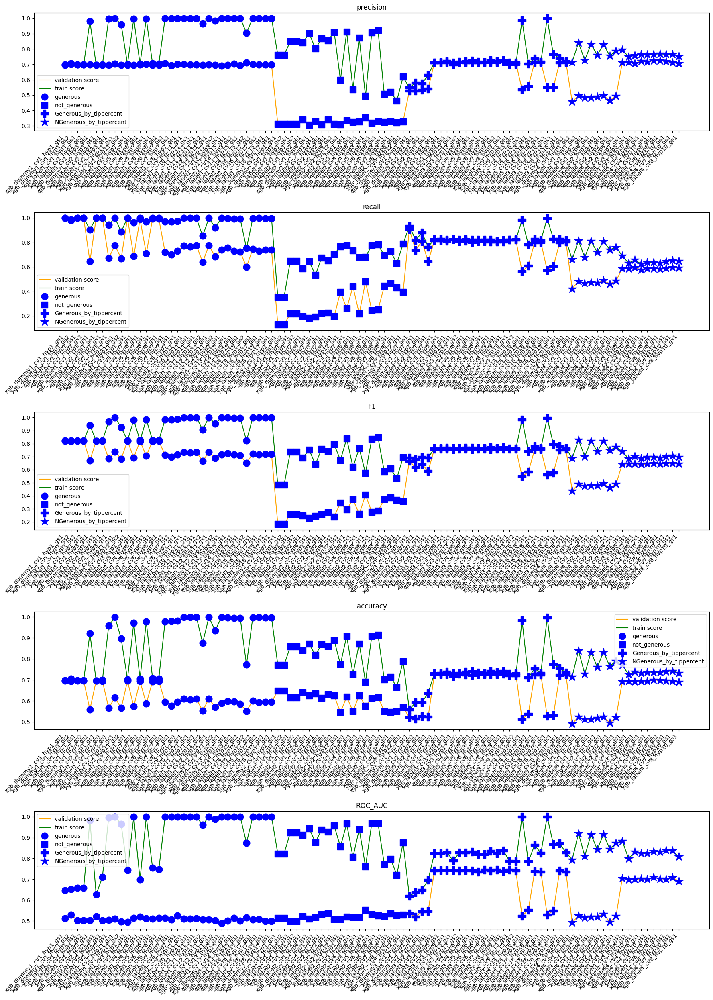

In [64]:
##############################################
#Show Validation Results
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(xgb_val_score['model'], xgb_val_score[metric], color='orange', label='validation score')
    ax.plot(xgb_train_score['model'], xgb_train_score[metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #generous
        '_dummy1_|_label1_',
        #not_generous
        '_dummy2_|_label2_',
        #Generous_by_tippercent
        '_dummy3_|_label3_',
        #NGenerous_by_tippercent
        '_dummy4_|_label4_',
    ]
    marker_list=['bo','bs','bP','b*']
    markersize_list=[12,12,15,16]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(xgb_val_score[xgb_val_score['model'].str.contains(substr)]['model'], xgb_val_score[xgb_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(xgb_train_score[xgb_train_score['model'].str.contains(substr)]['model'], xgb_train_score[xgb_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout()
plt.show()

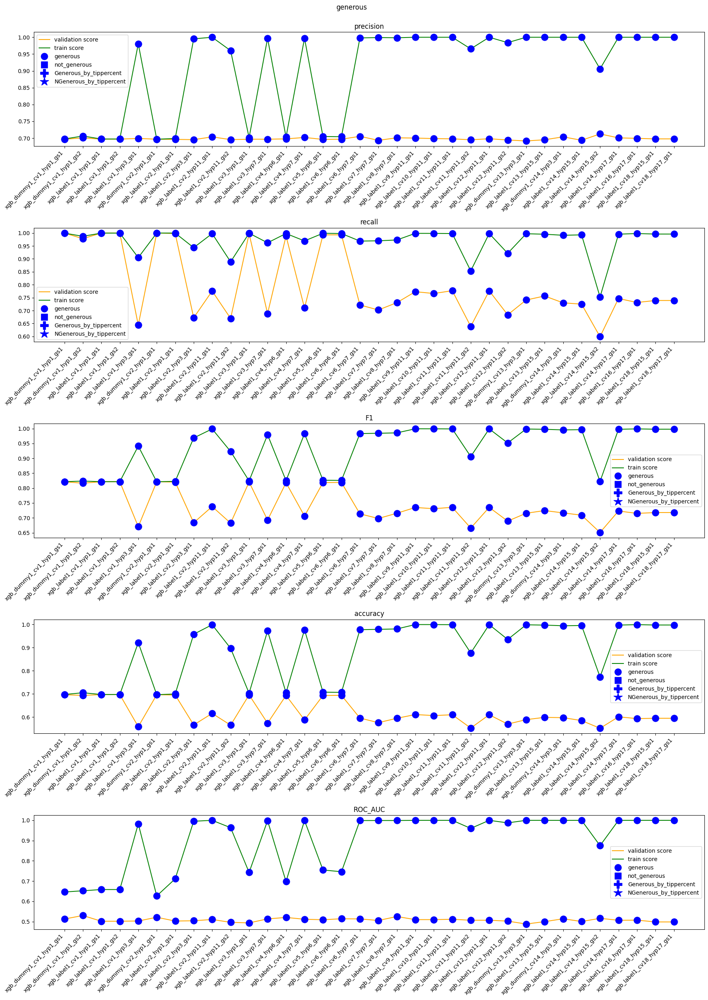

In [65]:
##############################################
#Show Validation Results
#generous(porportion of generous=1 is around 70%)
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    mask_val=xgb_val_score['model'].str.contains('label1|dummy1')
    mask_train=xgb_train_score['model'].str.contains('label1|dummy1')
    ax.plot(xgb_val_score[mask_val]['model'], xgb_val_score[mask_val][metric], color='orange', label='validation score')
    ax.plot(xgb_train_score[mask_train]['model'], xgb_train_score[mask_train][metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #generous
        '_dummy1_|_label1_',
        #not_generous
        '_dummy2_|_label2_',
        #Generous_by_tippercent
        '_dummy3_|_label3_',
        #NGenerous_by_tippercent
        '_dummy4_|_label4_',
    ]
    marker_list=['bo','bs','bP','b*']
    markersize_list=[12,12,15,16]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(xgb_val_score[mask_val&xgb_val_score['model'].str.contains(substr)]['model'], xgb_val_score[mask_val&xgb_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(xgb_train_score[mask_train&xgb_train_score['model'].str.contains(substr)]['model'], xgb_train_score[mask_train&xgb_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()
plt.suptitle('generous',y=1)
plt.tight_layout()
plt.show()

#we could observe traning f1 scores and validation f1 scores of some models(e.g. xgb_dummy1_cv1_hyp1_gs1) were very close
#however their recall scores were close to 1, which indicate the models only predicted one class
#the model didn't work as a claasification model
#when used scale_pos_weight to adjust the balance of two classes, models began to predict other class
#we can observe valication scores decreased a lot in many models, no big change in some models
#however all of the models the scores were not good, this indicate we lack of some important features
#ROC_AUC is around 50%, accuracy is under 70%(major class is 70%)
#very close to random guess, not recommend to use

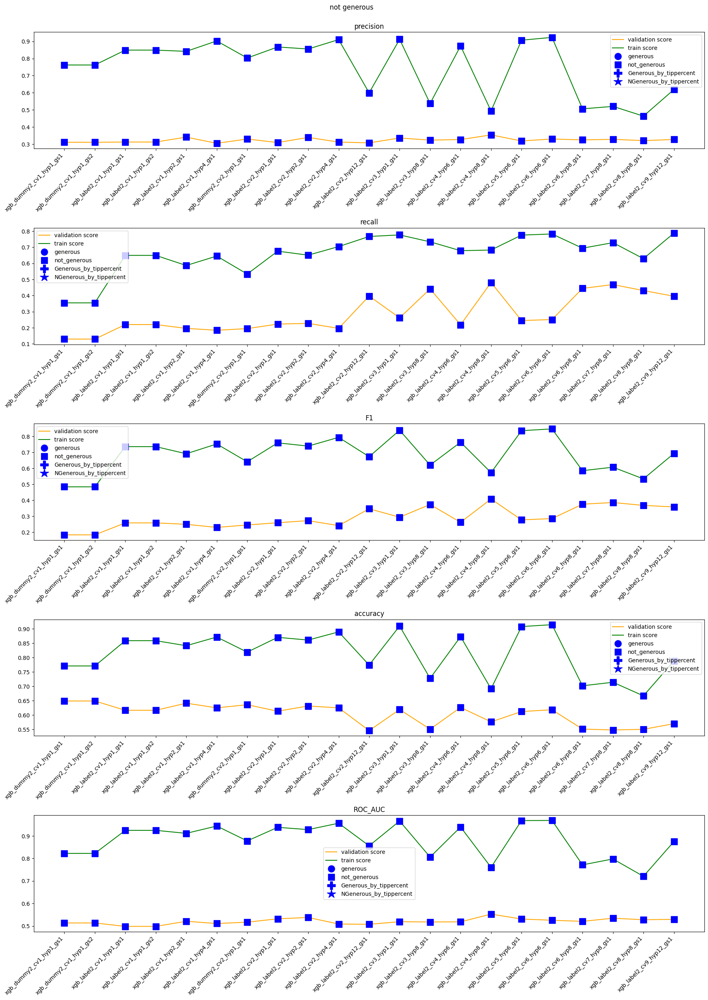

In [66]:
##############################################
#Show Validation Results
#not generous
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    mask_val=xgb_val_score['model'].str.contains('label2|dummy2')
    mask_train=xgb_train_score['model'].str.contains('label2|dummy2')
    ax.plot(xgb_val_score[mask_val]['model'], xgb_val_score[mask_val][metric], color='orange', label='validation score')
    ax.plot(xgb_train_score[mask_train]['model'], xgb_train_score[mask_train][metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #generous
        '_dummy1_|_label1_',
        #not_generous
        '_dummy2_|_label2_',
        #Generous_by_tippercent
        '_dummy3_|_label3_',
        #NGenerous_by_tippercent
        '_dummy4_|_label4_',
    ]
    marker_list=['bo','bs','bP','b*']
    markersize_list=[12,12,15,16]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(xgb_val_score[mask_val&xgb_val_score['model'].str.contains(substr)]['model'], xgb_val_score[mask_val&xgb_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(xgb_train_score[mask_train&xgb_train_score['model'].str.contains(substr)]['model'], xgb_train_score[mask_train&xgb_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()
plt.suptitle('not generous',y=1)
plt.tight_layout()
plt.show()

#just for comparing, will not use

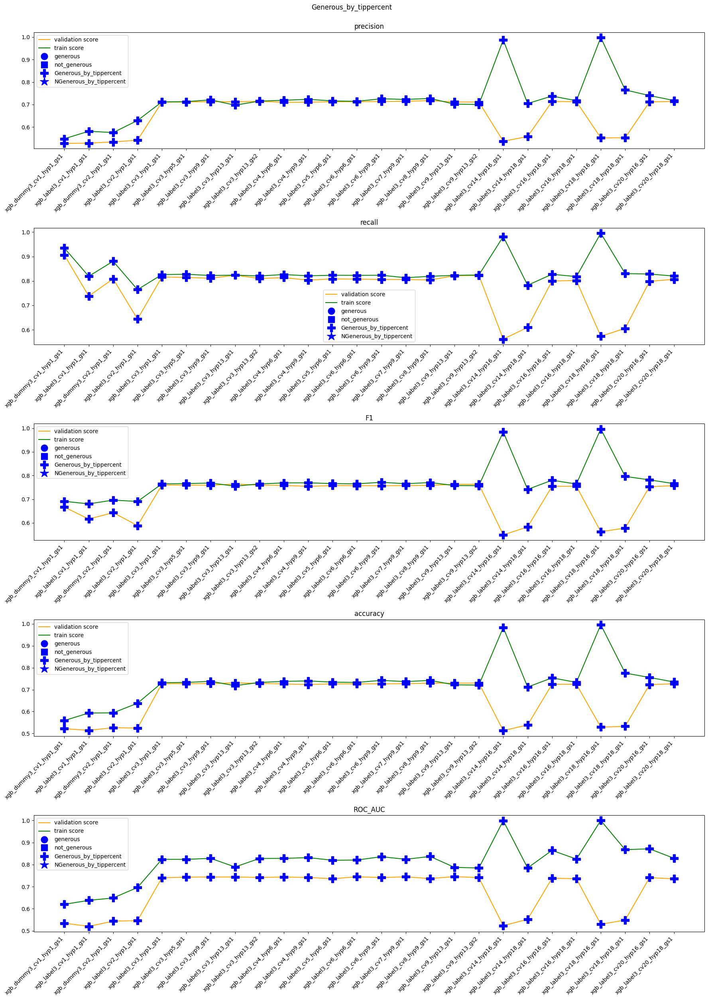

In [67]:
##############################################
#Show Validation Results
#Generous_by_tippercent
#(porportion of Generous_by_tippercent=1 is around 53%)
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    mask_val=xgb_val_score['model'].str.contains('label3|dummy3')
    mask_train=xgb_train_score['model'].str.contains('label3|dummy3')
    ax.plot(xgb_val_score[mask_val]['model'], xgb_val_score[mask_val][metric], color='orange', label='validation score')
    ax.plot(xgb_train_score[mask_train]['model'], xgb_train_score[mask_train][metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #generous
        '_dummy1_|_label1_',
        #not_generous
        '_dummy2_|_label2_',
        #Generous_by_tippercent
        '_dummy3_|_label3_',
        #NGenerous_by_tippercent
        '_dummy4_|_label4_',
    ]
    marker_list=['bo','bs','bP','b*']
    markersize_list=[12,12,15,16]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(xgb_val_score[mask_val&xgb_val_score['model'].str.contains(substr)]['model'], xgb_val_score[mask_val&xgb_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(xgb_train_score[mask_train&xgb_train_score['model'].str.contains(substr)]['model'], xgb_train_score[mask_train&xgb_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()
plt.suptitle('Generous_by_tippercent',y=1)
plt.tight_layout()
plt.show()

#we could observe when use 'VendorID' to predict, both f1 score and accuracy score increased
#'VendorID' seems to be an important features
#according to Analyze results, we know that these two vendors seems to have different way to round tip amount
#different from 'generous', recall of all models were not 1, precision were not 1

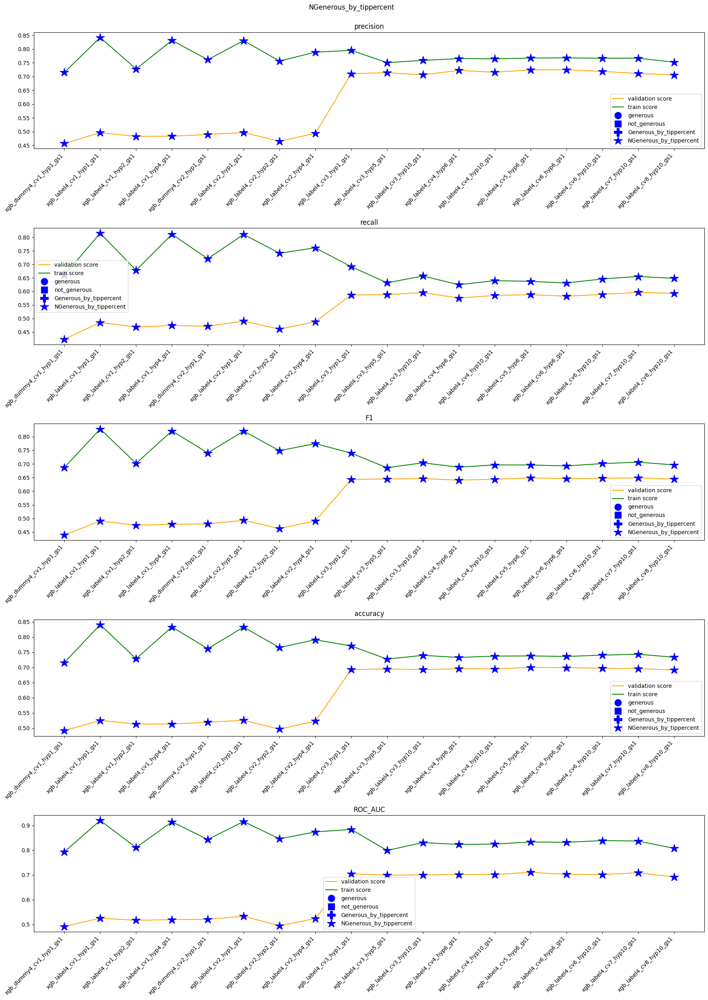

In [68]:
##############################################
#Show Validation Results
#NGenerous_by_tippercent
##############################################

fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

#plot validation scores
for metric, ax in zip(metrics, axs.ravel()):
    mask_val=xgb_val_score['model'].str.contains('label4|dummy4')
    mask_train=xgb_train_score['model'].str.contains('label4|dummy4')
    ax.plot(xgb_val_score[mask_val]['model'], xgb_val_score[mask_val][metric], color='orange', label='validation score')
    ax.plot(xgb_train_score[mask_train]['model'], xgb_train_score[mask_train][metric], color='green', label='train score')
    
    #add marker to target variables
    substr_list=[
        #generous
        '_dummy1_|_label1_',
        #not_generous
        '_dummy2_|_label2_',
        #Generous_by_tippercent
        '_dummy3_|_label3_',
        #NGenerous_by_tippercent
        '_dummy4_|_label4_',
    ]
    marker_list=['bo','bs','bP','b*']
    markersize_list=[12,12,15,16]
    for substr,unit_marker, unit_marker_size, unit_index in zip(substr_list,marker_list,markersize_list,range(1,len(substr_list)+1)):
        ax.plot(xgb_val_score[mask_val&xgb_val_score['model'].str.contains(substr)]['model'], xgb_val_score[mask_val&xgb_val_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size,label=f"{depedent_variables[unit_index-1]}")
        ax.plot(xgb_train_score[mask_train&xgb_train_score['model'].str.contains(substr)]['model'], xgb_train_score[mask_train&xgb_train_score['model'].str.contains(substr)][metric], unit_marker,markersize=unit_marker_size)

    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()
plt.suptitle('NGenerous_by_tippercent',y=1)
plt.tight_layout()
plt.show()
#just for comparing, will not use

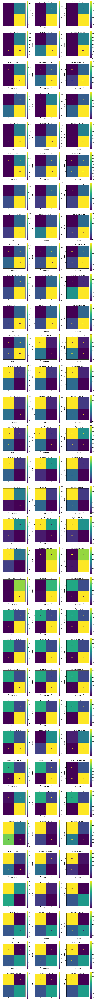

In [69]:
#################################################################################
##Display confusion on validation data
#################################################################################
rowCount=math.ceil(len(xgb_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for xgb_cv, ax, index in zip(xgb_cv_list, axes.flatten(), range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        confusion_matrix_plot_ax(xgb_cv, 
                              X_dummy_val[select_feature], 
                              y_dummy_val, 
                              ax=ax, 
                              title=xgb_model_name_list[index])
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        confusion_matrix_plot_ax(xgb_cv, 
                              X_label_val[select_feature],
                              y_label_val, 
                              ax=ax, 
                              title=xgb_model_name_list[index])

plt.tight_layout()
plt.show()

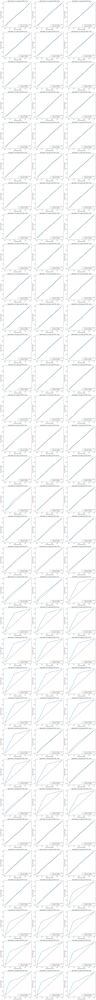

In [70]:
#############################################################
#Plot AUC curve
#############################################################
rowCount=math.ceil(len(xgb_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for xgb_cv, ax, index in zip(xgb_cv_list, axes.flatten(), range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_val=X_dummy_val_list[target_index]
        y_dummy_val=y_dummy_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_val.columns,'dummy')
        # plot ROC curve
        xgb_preds_proba=xgb_best.predict_proba(X_dummy_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_dummy_val, xgb_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_dummy_val, xgb_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{xgb_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_val=X_label_val_list[target_index]
        y_label_val=y_label_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_val.columns,'label')
        # plot ROC curve
        xgb_preds_proba=xgb_best.predict_proba(X_label_val[select_feature])[:, 1]
        fpr, tpr, thresholds = roc_curve(y_label_val, xgb_preds_proba, pos_label=1)
        roc_auc = roc_auc_score(y_label_val, xgb_preds_proba)
        ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1], 'k--', label='Random classifier') 
        ax.set_xlabel('False Positive Rate') 
        ax.set_ylabel('True Positive Rate') 
        ax.set_title(f'{xgb_model_name_list[index]} ROC Curve')
        ax.legend(loc="lower right")

plt.tight_layout()
plt.show()

#for generous and not generous, ROC_AUC score were close to 0.5
#for Generous_by_tippercent and NGenerous_by_tippercent, when use 'VendorID'
#ROC_AUC score were close to 0.7

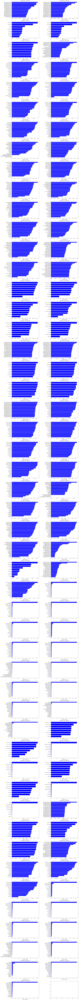

In [71]:
#############################################################
#Plot feature importance
#############################################################
import math

rowCount=math.ceil(len(xgb_cv_list)/2)
fig, axes = plt.subplots(nrows=rowCount, ncols=2, figsize=(20,rowCount*5))

for xgb_cv, ax, index in zip(xgb_cv_list, axes.flatten(), range(len(xgb_cv_list))):
    xgb_best=xgb_cv.best_estimator_
    importances = xgb_best.feature_importances_

    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
    elif 'xgb_label' in xgb_model_name_list[index]:
        features=get_fit_features(select_col,X_label_val.columns,'label')

    indices = np.argsort(importances)
    # customized number
    if len(importances)>=20:
        num_features = 20
    else:
        num_features =len(importances)

    ax.set_title(xgb_model_name_list[index])
    # only plot the customized number of features
    ax.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
    ax.set_yticks(range(num_features),[features[i] for i in indices[-num_features:]])
    ax.set_xlabel('Relative Importance')

plt.tight_layout()
plt.show()

### Fit model with train and validation set

* The best model I chose 
    * Consider tip_amount calculation difference: `rf_label1_cv14_hyp8_gs1`
    * Not Consider tip_amount calculation difference, Not use VendorID: `xgb_label3_cv14_hyp18_gs1`
    * Not Consider tip_amount calculation difference, use VendorID: `rf_label3_cv16_hyp8_gs1`

#### Fit train+validation set with best hyperparameters
#### Get test score

In [72]:
%%script True
#########################################################
#Good model
#Consider tip_amount calculation difference
#########################################################
#get best params
best_model_index=xgb_model_name_list.index('xgb_label1_cv14_hyp17_gs1')
best_xgb=xgb_cv_list[best_model_index]
best_params=best_xgb.best_params_

best_model_name=xgb_model_name_list[best_model_index]
#pickle file xgb_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'xgb Model name' in best_params:
        best_params.pop('xgb Model name')
xgb_classifier_best = XGBClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'xgb_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'xgb_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_dummy_train_val[select_feature], y_dummy_train_val)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    xgb_preds=xgb_classifier_best.predict(X_dummy_test[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_dummy_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, xgb_preds, y_dummy_test,xgb_preds_proba)
        
elif 'xgb_label' in best_model_name:
    target_index=find_number(best_model_name, 'xgb_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_label_train_val[select_feature], y_label_train_val)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    xgb_preds=xgb_classifier_best.predict(X_label_test[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_label_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, xgb_preds, y_label_test,xgb_preds_proba)

xgb_test_score=pd.concat([test_score]).reset_index(drop=True)
xgb_test_score.to_csv('xgb_test_score.csv', index=False, mode='w')
xgb_test_score

Couldn't find program: 'True'


In [73]:
#########################################################
#Best model
#Not consider tip amount calculation difference between two vendors
#if we could not use VendorID
#########################################################
#get best params
best_model_index=xgb_model_name_list.index('xgb_label3_cv14_hyp18_gs1')
best_xgb=xgb_cv_list[best_model_index]
best_params=best_xgb.best_params_

best_model_name=xgb_model_name_list[best_model_index]
#pickle file xgb_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'xgb Model name' in best_params:
        best_params.pop('xgb Model name')
xgb_classifier_best = XGBClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'xgb_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'xgb_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_dummy_train_val[select_feature], y_dummy_train_val)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    xgb_preds=xgb_classifier_best.predict(X_dummy_test[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_dummy_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, xgb_preds, y_dummy_test,xgb_preds_proba)
        
elif 'xgb_label' in best_model_name:
    target_index=find_number(best_model_name, 'xgb_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_label_train_val[select_feature], y_label_train_val)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    xgb_preds=xgb_classifier_best.predict(X_label_test[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_label_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, xgb_preds, y_label_test,xgb_preds_proba)

xgb_test_score=pd.concat([test_score]).reset_index(drop=True)
xgb_test_score.to_csv('xgb_test_score.csv', index=False, mode='a')
xgb_test_score

best hyperpatameters: {'colsample_bytree': 0.3, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 0.001, 'n_estimators': 120, 'scale_pos_weight': 1, 'subsample': 0.7, 'xgb Model name': 'xgb_label3_cv14_hyp18_gs1'}
best features: ['RatecodeID', 'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed', 'predict_fare_amount', 'PU_month', 'PU_weekday', 'PU_hour']
best model name: xgb_label3_cv14_hyp18_gs1


,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
0,xgb_label3_cv14_hyp18_gs1,0.551646,0.622075,0.584748,0.53319,0.540218,0.560398,0.6097,0.581088,0.588101


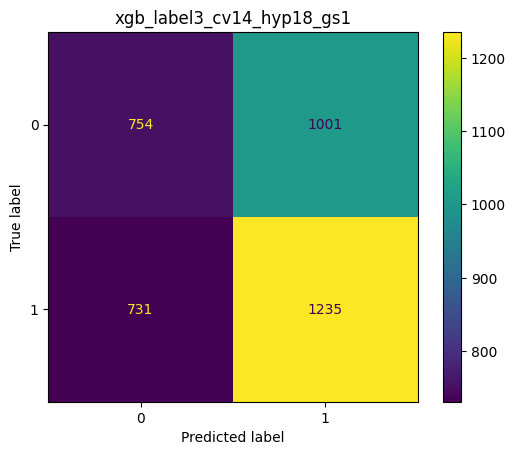

In [74]:
################################################
#Display confusion matrix of champion model
################################################
confusion_matrix_plot(best_xgb, 
                      X_label_test[select_feature], 
                      y_label_test, 
                      title=best_model_name)

In [75]:
%%script True
#########################################################
#Good model
#Not consider tip amount calculation difference between two vendors
#if we could use VendorID
#########################################################
#get best params
best_model_index=xgb_model_name_list.index('xgb_label3_cv16_hyp18_gs1')
best_xgb=xgb_cv_list[best_model_index]
best_params=best_xgb.best_params_

best_model_name=xgb_model_name_list[best_model_index]
#pickle file xgb_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'xgb Model name' in best_params:
        best_params.pop('xgb Model name')
xgb_classifier_best = XGBClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'xgb_dummy' in best_model_name:
    target_index=find_number(best_model_name, 'xgb_dummy')[0]-1
    X_dummy_train_val=X_dummy_train_val_list[target_index]
    y_dummy_train_val=y_dummy_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_dummy_train_val[select_feature], y_dummy_train_val)

    #get test score
    X_dummy_test=X_dummy_test_list[target_index]
    y_dummy_test=y_dummy_test_list[target_index]
    xgb_preds=xgb_classifier_best.predict(X_dummy_test[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_dummy_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, xgb_preds, y_dummy_test,xgb_preds_proba)
        
elif 'xgb_label' in best_model_name:
    target_index=find_number(best_model_name, 'xgb_label')[0]-1
    X_label_train_val=X_label_train_val_list[target_index]
    y_label_train_val=y_label_train_val_list[target_index]
    select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_label_train_val[select_feature], y_label_train_val)
    
    #get test score
    X_label_test=X_label_test_list[target_index]
    y_label_test=y_label_test_list[target_index]
    xgb_preds=xgb_classifier_best.predict(X_label_test[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_label_test[select_feature])[:, 1]
    test_score=get_test_scores(best_model_name, xgb_preds, y_label_test,xgb_preds_proba)

xgb_test_score=pd.concat([test_score]).reset_index(drop=True)
xgb_test_score.to_csv('xgb_test_score.csv', index=False, mode='a')
xgb_test_score

Couldn't find program: 'True'


In [76]:
###################################################
#Just see all models
###################################################
xgb_all_test_score_list=[]
for xgb_cv, index in zip(xgb_cv_list, range(len(xgb_cv_list))):
    xgb_params=xgb_cv.best_params_
    if 'xgb Model name' in xgb_params:
        xgb_params.pop('xgb Model name')
    xgb_classifier = XGBClassifier(**xgb_params,
                                          random_state=RANDOM_STATE)
    #pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
    params_index=find_number(xgb_model_name_list[index], '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'xgb_dummy' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
        X_dummy_train_val=X_dummy_train_val_list[target_index]
        y_dummy_train_val=y_dummy_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_dummy_train_val.columns,'dummy')
        # Fiting the model to the training data using the best parameters
        xgb_classifier.fit(X_dummy_train_val[select_feature], y_dummy_train_val)
        
        X_dummy_test=X_dummy_test_list[target_index]
        y_dummy_test=y_dummy_test_list[target_index]
        xgb_preds=xgb_classifier.predict(X_dummy_test[select_feature])
        xgb_preds_proba=xgb_classifier.predict_proba(X_dummy_test[select_feature])[:, 1]
        test_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_dummy_test,xgb_preds_proba)
        
    elif 'xgb_label' in xgb_model_name_list[index]:
        target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
        X_label_train_val=X_label_train_val_list[target_index]
        y_label_train_val=y_label_train_val_list[target_index]
        select_feature=get_fit_features(select_col,X_label_train_val.columns,'label')
        # Fiting the model to the training data using the best parameters
        xgb_classifier.fit(X_label_train_val[select_feature], y_label_train_val)
        
        X_label_test=X_label_test_list[target_index]
        y_label_test=y_label_test_list[target_index]
        xgb_preds=xgb_classifier.predict(X_label_test[select_feature])
        xgb_preds_proba=xgb_classifier.predict_proba(X_label_test[select_feature])[:, 1]
        test_score=get_test_scores(xgb_model_name_list[index], xgb_preds, y_label_test,xgb_preds_proba)
    
    xgb_all_test_score_list.append(test_score)

xgb_all_test_score=pd.concat(xgb_all_test_score_list).reset_index(drop=True)
xgb_all_test_score.to_csv('xgb_all_test_score.csv', index=False)
xgb_all_test_score

,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
0,xgb_dummy1_cv1_hyp1_gs1,0.696717,0.998843,0.820862,0.696318,0.529567,0.727050,0.934422,0.805790,0.835000
1,xgb_dummy1_cv1_hyp1_gs2,0.699072,0.987654,0.818676,0.695243,0.534908,0.728429,0.926827,0.804232,0.832206
2,xgb_label1_cv1_hyp1_gs1,0.696717,0.998843,0.820862,0.696318,0.530552,0.727050,0.934422,0.805790,0.835000
3,xgb_label1_cv1_hyp1_gs2,0.696717,0.998843,0.820862,0.696318,0.530552,0.727050,0.934422,0.805790,0.835000
4,xgb_label1_cv1_hyp3_gs1,0.710627,0.642361,0.674772,0.568664,0.528286,0.700361,0.652324,0.678365,0.671552
...,...,...,...,...,...,...,...,...,...,...
94,xgb_label4_cv5_hyp6_gs1,0.736413,0.617664,0.671831,0.715399,0.732469,0.717389,0.633915,0.678074,0.666279
95,xgb_label4_cv6_hyp6_gs1,0.733926,0.611396,0.667081,0.712174,0.728704,0.714184,0.628066,0.673520,0.661357
96,xgb_label4_cv6_hyp10_gs1,0.731675,0.619943,0.671191,0.713518,0.732255,0.713927,0.635368,0.677066,0.665959
97,xgb_label4_cv7_hyp10_gs1,0.732543,0.633618,0.679499,0.718087,0.727921,0.717100,0.647520,0.684703,0.674855


In [77]:
#Confirm test scores of generous
#Consider tip amount calculation difference between two vendors
xgb_all_test_score[xgb_all_test_score['model'].str.contains('label1|dummy1')]

,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
0,xgb_dummy1_cv1_hyp1_gs1,0.696717,0.998843,0.820862,0.696318,0.529567,0.727050,0.934422,0.805790,0.835000
1,xgb_dummy1_cv1_hyp1_gs2,0.699072,0.987654,0.818676,0.695243,0.534908,0.728429,0.926827,0.804232,0.832206
2,xgb_label1_cv1_hyp1_gs1,0.696717,0.998843,0.820862,0.696318,0.530552,0.727050,0.934422,0.805790,0.835000
3,xgb_label1_cv1_hyp1_gs2,0.696717,0.998843,0.820862,0.696318,0.530552,0.727050,0.934422,0.805790,0.835000
4,xgb_label1_cv1_hyp3_gs1,0.710627,0.642361,0.674772,0.568664,0.528286,0.700361,0.652324,0.678365,0.671552
5,xgb_dummy1_cv2_hyp1_gs1,0.696587,1.000000,0.821163,0.696587,0.549013,0.727012,0.935237,0.806031,0.835358
6,xgb_label1_cv2_hyp1_gs1,0.696472,0.997685,0.820301,0.695512,0.529285,0.726735,0.933500,0.805272,0.834398
7,xgb_label1_cv2_hyp3_gs1,0.705569,0.664738,0.684545,0.573233,0.522167,0.699642,0.670910,0.686693,0.682612
8,xgb_label1_cv2_hyp11_gs1,0.698886,0.750386,0.723721,0.600914,0.503742,0.705565,0.741697,0.721031,0.726173
9,xgb_label1_cv2_hyp11_gs2,0.707615,0.648920,0.676997,0.568664,0.514940,0.698895,0.657592,0.680086,0.674225


In [78]:
#Confirm test scores of Generous_by_tippercent
#Not consider tip amount calculation difference between two vendors
xgb_all_test_score[xgb_all_test_score['model'].str.contains('label3|dummy3')]

,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
55,xgb_dummy3_cv1_hyp1_gs1,0.534376,0.921160,0.676377,0.534265,0.543781,0.567227,0.826099,0.658022,0.693899
56,xgb_label3_cv1_hyp1_gs1,0.543748,0.780773,0.641052,0.538027,0.547029,0.567511,0.730171,0.629232,0.652142
57,xgb_dummy3_cv2_hyp1_gs1,0.542691,0.853510,0.663503,0.542596,0.553733,0.571392,0.782279,0.648352,0.677842
58,xgb_label3_cv2_hyp1_gs1,0.554936,0.709054,0.622599,0.545821,0.558415,0.572088,0.679071,0.614731,0.629897
59,xgb_label3_cv3_hyp1_gs1,0.685653,0.814344,0.744478,0.704649,0.712456,0.700931,0.790748,0.737833,0.750597
60,xgb_label3_cv3_hyp5_gs1,0.689236,0.807731,0.743794,0.705993,0.714375,0.703471,0.786241,0.737664,0.749431
61,xgb_label3_cv3_hyp9_gs1,0.689112,0.801628,0.741124,0.704112,0.712485,0.702717,0.781346,0.735298,0.746478
62,xgb_label3_cv3_hyp13_gs1,0.683808,0.818413,0.745080,0.704112,0.719575,0.699681,0.793578,0.738137,0.751478
63,xgb_label3_cv3_hyp13_gs2,0.687337,0.806205,0.742041,0.703843,0.717283,0.701606,0.784632,0.735893,0.747696
64,xgb_label3_cv4_hyp6_gs1,0.687284,0.808240,0.742871,0.704381,0.719998,0.701770,0.786241,0.736617,0.748624


### Fit model with all data

#### Fit whole set(clean data) with best hyperpatameters
#### Predict whole set

In [79]:
%%script True
#########################################################
#Best model
#Consider tip_amount calculation difference
#this type will choose random forest 
#########################################################
#get best params
best_model_index=xgb_model_name_list.index('xgb_label1_cv14_hyp17_gs1')
best_xgb=xgb_cv_list[best_model_index]
best_params=best_xgb.best_params_
#**best_xgb.best_params_

best_model_name=xgb_model_name_list[best_model_index]
#pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get score
###################################################
if 'xgb Model name' in best_params:
        best_params.pop('xgb Model name')
xgb_classifier_best = XGBClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'xgb_dummy' in best_model_name:
    target_index=find_number(xgb_model_name_list[index], 'xgb_dummy')[0]-1
    y_dummy=y_dummy_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_dummy[select_feature], y_dummy)

    #Predict whole set
    xgb_preds=xgb_classifier_best.predict(X_dummy[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_dummy[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, xgb_preds, y_dummy,xgb_preds_proba)
        
elif 'xgb_label' in best_model_name:
    target_index=find_number(xgb_model_name_list[index], 'xgb_label')[0]-1
    y_label=y_label_list[target_index]
    select_feature=get_fit_features(select_col,X_label.columns,'label')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_label[select_feature], y_label)
    
    #Predict whole set
    xgb_preds=xgb_classifier_best.predict(X_label[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_label[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, xgb_preds, y_label,xgb_preds_proba)

xgb_wholeset_score=pd.concat([all_score]).reset_index(drop=True)
xgb_wholeset_score.to_csv('xgb_wholeset_score.csv', index=False, mode='w')
xgb_wholeset_score

Couldn't find program: 'True'


In [80]:
#########################################################
#Best model
#Not Consider tip_amount calculation difference
#if we could not use VendorID
#this type will choose xgb
#########################################################
#get best params
best_model_index=xgb_model_name_list.index('xgb_label3_cv14_hyp18_gs1')
best_xgb=xgb_cv_list[best_model_index]
best_params=best_xgb.best_params_
#**best_xgb.best_params_
best_model_name=xgb_model_name_list[best_model_index]
#pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get score
###################################################
if 'xgb Model name' in best_params:
        best_params.pop('xgb Model name')
xgb_classifier_best = XGBClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'xgb_dummy' in best_model_name:
    target_index=find_number(xgb_model_name_list[best_model_index], 'xgb_dummy')[0]-1
    y_dummy=y_dummy_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_dummy[select_feature], y_dummy)

    #Predict whole set
    xgb_preds=xgb_classifier_best.predict(X_dummy[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_dummy[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, xgb_preds, y_dummy,xgb_preds_proba)
        
elif 'xgb_label' in best_model_name:
    target_index=find_number(xgb_model_name_list[best_model_index], 'xgb_label')[0]-1
    y_label=y_label_list[target_index]
    select_feature=get_fit_features(select_col,X_label.columns,'label')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_label[select_feature], y_label)
    
    #Predict whole set
    xgb_preds=xgb_classifier_best.predict(X_label[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_label[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, xgb_preds, y_label,xgb_preds_proba)

xgb_wholeset_score=pd.concat([all_score]).reset_index(drop=True)
xgb_wholeset_score.to_csv('xgb_wholeset_score.csv', index=False, mode='a')
xgb_wholeset_score

best hyperpatameters: {'colsample_bytree': 0.3, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 0.001, 'n_estimators': 120, 'scale_pos_weight': 1, 'subsample': 0.7}
best features: ['RatecodeID', 'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed', 'predict_fare_amount', 'PU_month', 'PU_weekday', 'PU_hour']
best model name: xgb_label3_cv14_hyp18_gs1


,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
0,xgb_label3_cv14_hyp18_gs1,0.666143,0.75477,0.707692,0.670631,0.734894,0.677109,0.739136,0.703089,0.711912


In [81]:
#########################################################
#Best model
#Not Consider tip_amount calculation difference
#if we could use VendorID
#this type will choose random forest 
#########################################################
#get best params
best_model_index=xgb_model_name_list.index('xgb_label3_cv16_hyp18_gs1')
best_xgb=xgb_cv_list[best_model_index]
best_params=best_xgb.best_params_
#**best_xgb.best_params_
best_model_name=xgb_model_name_list[best_model_index]
#pickle file xgb_[dummy|label]_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()
print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get score
###################################################
if 'xgb Model name' in best_params:
        best_params.pop('xgb Model name')
xgb_classifier_best = XGBClassifier(**best_params,
                                          random_state=RANDOM_STATE)
if 'xgb_dummy' in best_model_name:
    target_index=find_number(xgb_model_name_list[best_model_index], 'xgb_dummy')[0]-1
    y_dummy=y_dummy_list[target_index]
    select_feature=get_fit_features(select_col,X_dummy.columns,'dummy')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_dummy[select_feature], y_dummy)

    #Predict whole set
    xgb_preds=xgb_classifier_best.predict(X_dummy[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_dummy[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, xgb_preds, y_dummy,xgb_preds_proba)
        
elif 'xgb_label' in best_model_name:
    target_index=find_number(xgb_model_name_list[best_model_index], 'xgb_label')[0]-1
    y_label=y_label_list[target_index]
    select_feature=get_fit_features(select_col,X_label.columns,'label')
    # Fiting the model to the training data using the best parameters
    xgb_classifier_best.fit(X_label[select_feature], y_label)
    
    #Predict whole set
    xgb_preds=xgb_classifier_best.predict(X_label[select_feature])
    xgb_preds_proba=xgb_classifier_best.predict_proba(X_label[select_feature])[:, 1]
    all_score=get_test_scores(best_model_name, xgb_preds, y_label,xgb_preds_proba)

xgb_wholeset_score=pd.concat([all_score]).reset_index(drop=True)
xgb_wholeset_score.to_csv('xgb_wholeset_score.csv', index=False, mode='a')
xgb_wholeset_score

best hyperpatameters: {'colsample_bytree': 0.3, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 0.001, 'n_estimators': 120, 'scale_pos_weight': 1, 'subsample': 0.5}
best features: ['RatecodeID', 'VendorID', 'mean_trip_distance', 'mean_trip_duration', 'mean_trip_speed', 'predict_fare_amount', 'PU_month', 'PU_weekday', 'PU_hour']
best model name: xgb_label3_cv16_hyp18_gs1


,model,precision,recall,F1,accuracy,ROC_AUC,Fbeta1,Fbeta2,Fbeta3,Fbeta4
0,xgb_label3_cv16_hyp18_gs1,0.708785,0.814805,0.758107,0.725324,0.803328,0.721738,0.795879,0.752609,0.763153


### **Conclusion**

* Not Consider tip_amount calculation difference, Not use VendorID: `xgb_label3_cv14_hyp18_gs1`
    * Model features: `RatecodeID`,`mean_trip_distance`, `mean_trip_duration`, `mean_trip_speed`,`predict_fare_amount`, `PU_month`, `PU_weekday`,`PU_hour`
    * `mean_trip_distance`, `mean_trip_duration`, `mean_trip_speed`,`predict_fare_amount` were important features
    * Model assumptions:
        * Two vendors had the same way to calculate tip_amount
        * Tip_percent which calculated from tip_amount could reflect the actual choice of passengers
    * Limitation:
        * Could only predict credit card trips
    * Model score:			

|score|precision|recall   |F1      |accuracy|ROC_AUC |
|:-   |:-       |:-       |:-      |:-      |:-      |
|train|0.704602 |0.782443 |0.741485|0.711838|0.784784|
|val  |0.558140 |0.610169 |0.582996|0.538737|0.552162|
|test |0.551646 |0.622075 |0.584748|0.53319 |0.540218|


    
    
    

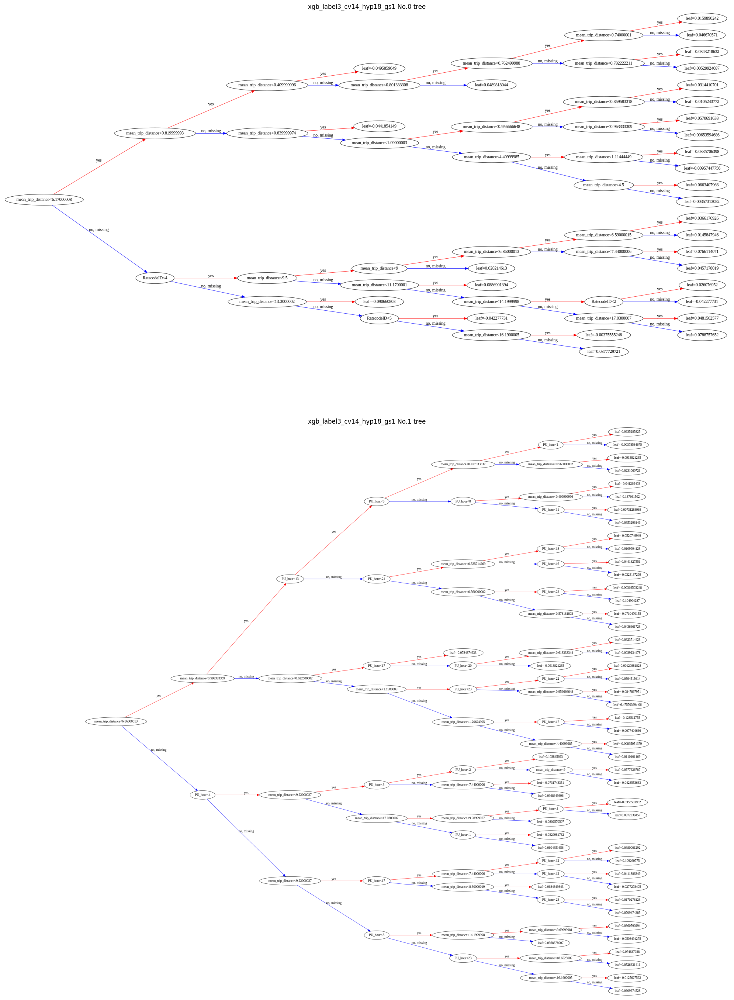

In [82]:
#############################################################
#Plot tree of champion model
#############################################################

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20,30))

champion_model_name='xgb_label3_cv14_hyp18_gs1'
best_model_index=xgb_model_name_list.index(champion_model_name)
model_best=xgb_cv_list[best_model_index].best_estimator_
importances = model_best.feature_importances_


params_index=find_number(champion_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()

if '_dummy' in champion_model_name:
    features=get_fit_features(select_col,X_dummy_val.columns,'dummy')
elif '_label' in champion_model_name:
     features=get_fit_features(select_col,X_label_val.columns,'label')

#plot the first tree
plot_tree(model_best, num_trees=0, rankdir='LR',ax=axes[0])
axes[0].set_title(f'{champion_model_name} No.0 tree')

#plot the second tree
plot_tree(model_best, num_trees=1, rankdir='LR',ax=axes[1])
        
axes[1].set_title(f'{champion_model_name} No.1 tree')

plt.tight_layout()
plt.show()